# Overview

University of California, Berkeley

Master of Information and Data Science (MIDS) program

W281 - Computer Vision Final Project

**Year**: 2023

**Semester**: Fall

**Section**: 001

**Group Member**: Andrew Loeber, Yeshwanth Somu, Zhifei Dong


**Topic:** Land Use and Land Cover Classification of Satellite Imagery

**Dataset Source:** https://github.com/phelber/EuroSAT/tree/master

**Abstract**

Land use and land cover classification (LULC classification) is a process used in remote sensing and geographic information systems (GIS) to categorize and map the different types of land use and land cover within a specific geographic area. This can include categories like forests, wetlands, urban areas, agricultural fields, water bodies, and more. This classification helps to describe and analyze how land is being used and what types of surfaces or covers exist on the Earth's surface. Machine learning is commonly employed in the land cover classification by providing automated and efficient methods to process large amounts of satellite or aerial imagery data. In this study, we employ feature extraction and machine learning methods, in the form of Logistic Regression and XGBoost, for image classification of land use and land cover.




##Data

This dataset comes from the EuroSAT dataset which is a collection of 27,000 satellite images of land cover. These JPEG images are open source and freely available for analysis. Each image is a 64x64 RGB pixel grid labeled into 10 classes, shown below. The categories cover labels such as industrial parks, residential areas, agriculture and forest cover. Each class is assigned with a class ID (0-9) for model prediction purpose.

| Class ID | Class Label | Number of Images |
|-------------|-------------|------------------|
|0| Industrial     | 2500        |
|1| Residential     | 3000         |
|2| Highway     | 2500         |
|3| Annual Crop     | 3000         |
|4| Permanent Crop     | 2500         |
|5| Pasture     | 2000         |
|6| Herbaceous Vegetation     | 3000         |
|7| Forest     | 3000         |
|8| River     | 2500         |
|9| Sea Lake    | 3000        |

We explore feature extraction and machine learning algorithms that will be used to predict the label of each image. In order to do this, we split the 27,000 images into a train, validation and test set in 70/15/15, while ensuring a similar distribution of classes in each of the sets.






##Description


1.   Data and EDA
2.   Color-Based Feature Extraction


*   Color Histograms for Average RGB
*   K-Means Color Bin Histograms (LAB)


3.   Texture-Based Feature Extraction


*   Local Binary Patterns (LBP)
*   Histogram of Oriented Gradients (HOG)
*   Gray Level Co-oocurrence Matrix (GLCM)

4.   Feature Extraction using EfficientNet

5.   Classification







# Imports and Setup

In [1]:
# connect to google drive
from google.colab import drive
drive.mount('/content/drive')

# define drive path and data path
drive_path = '/content/drive/MyDrive/281-Project'
data_path = '/content/EuroSAT_RGB'

# unzip EuroSAT datasets to local drive
# !unzip -q '/content/drive/MyDrive/281-Project/EuroSAT_RGB.zip' -d '/content'

Mounted at /content/drive


In [2]:
# install umap
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 1.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 3.7 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=6874f29a316bcc1efef048caee60ff4d6675bbc4f4e162bf5c6ee7e028074237
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built umap-learn


In [3]:
# import libaries
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import pickle
import time
from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import MiniBatchKMeans
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, ParameterGrid
import xgboost as xgb

from skimage.color import rgb2lab, lab2rgb, rgb2gray
from umap import UMAP

import tensorflow as tf
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.backend import relu
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy, MeanSquaredError, MeanAbsoluteError
from tensorflow.keras.metrics import  SparseCategoricalAccuracy, SparseTopKCategoricalAccuracy

In [4]:
cmap = {
    'Industrial':           'crimson',
    'Residential':          'coral',
    'Highway':              'xkcd:gray',
    'AnnualCrop':           'xkcd:goldenrod',
    'PermanentCrop':        'xkcd:wheat',
    'Pasture':              'xkcd:green',
    'HerbaceousVegetation': 'xkcd:olive',
    'Forest':               'xkcd:darkgreen',
    'River':                'xkcd:lightblue',
    'SeaLake':              'xkcd:blue',
}

In [5]:
cmap2 = ListedColormap([
    'xkcd:blue',
    'xkcd:lightblue',
    'xkcd:darkgreen',
    'xkcd:olive',
    'xkcd:green',
    'xkcd:wheat',
    'xkcd:goldenrod',
    'xkcd:gray',
    'coral',
    'crimson',
]).reversed()

# Load Metadata & Images

**Create Metadata from Images**

The unzipped EuroSAT image folder stores the categorized images in different folders named with its category. For example, image path *'EuroSAT_RGB/Highway/Highway_1592.jpg'* indicates that the image *'Highway_1592.jpg'* has an image ID of '1592' and is categorized as 'Highway' and saved in folder *'/Highway'*.

We examined all image files and created a metadata table that contains the image ID, file name, full path, class name, class ID, etc.   

**Split Data**

We split the datasets into train, validation and test datasets by 70%/15%/15%, respectively and save the metadata for future use. Therefore, for each dataset of train/validation/test, there is

1. **metadata.csv**: containing the image general information as described above
2. **imgs.npy**: containing the image RGBs in numpy array format
3. **labels.npy**: containing the class ID for each image   

In [6]:
# load metadata.csv for train, val, test
train_df = pd.read_csv(os.path.join(drive_path, 'data/train', 'metadata.csv'))
val_df = pd.read_csv(os.path.join(drive_path, 'data/val', 'metadata.csv'))
test_df = pd.read_csv(os.path.join(drive_path, 'data/test', 'metadata.csv'))
# remove extra column in test_df
test_df.drop('index', axis=1, inplace=True)

# load image RGBs in numpy array format
train_imgs = np.load(os.path.join(drive_path, 'data/train', 'imgs.npy'))
val_imgs = np.load(os.path.join(drive_path, 'data/val', 'imgs.npy'))
test_imgs = np.load(os.path.join(drive_path, 'data/test', 'imgs.npy'))

# load image class ID in numpy array format
train_labels = np.load(os.path.join(drive_path, 'data/train', 'labels.npy'))
val_labels = np.load(os.path.join(drive_path, 'data/val', 'labels.npy'))
test_labels = np.load(os.path.join(drive_path, 'data/test', 'labels.npy'))


In [7]:
# metadata preview
train_df.sample(10)

,record_id,class_name,class_id,class_file_num,file_name,file_path,dataset
12072,17223,HerbaceousVegetation,6,1724,HerbaceousVegetation_1724.jpg,/content/EuroSAT_RGB/HerbaceousVegetation/Herb...,train
15626,22319,River,8,820,River_820.jpg,/content/EuroSAT_RGB/River/River_820.jpg,train
11118,15885,HerbaceousVegetation,6,386,HerbaceousVegetation_386.jpg,/content/EuroSAT_RGB/HerbaceousVegetation/Herb...,train
15656,22358,River,8,859,River_859.jpg,/content/EuroSAT_RGB/River/River_859.jpg,train
436,613,Industrial,0,614,Industrial_614.jpg,/content/EuroSAT_RGB/Industrial/Industrial_614...,train
5709,8147,AnnualCrop,3,148,AnnualCrop_148.jpg,/content/EuroSAT_RGB/AnnualCrop/AnnualCrop_148...,train
7155,10206,AnnualCrop,3,2207,AnnualCrop_2207.jpg,/content/EuroSAT_RGB/AnnualCrop/AnnualCrop_220...,train
15889,22690,River,8,1191,River_1191.jpg,/content/EuroSAT_RGB/River/River_1191.jpg,train
13384,19117,Forest,7,618,Forest_618.jpg,/content/EuroSAT_RGB/Forest/Forest_618.jpg,train
4702,6749,Highway,2,1250,Highway_1250.jpg,/content/EuroSAT_RGB/Highway/Highway_1250.jpg,train


In [8]:
# review the size of metadata table
print('Size of train metadata: ', train_df.shape)
print('Size of validation metadata: ', val_df.shape)
print('Size of test metadata: ', test_df.shape)

Size of train metadata:  (18900, 7)
Size of validation metadata:  (4050, 7)
Size of test metadata:  (4050, 7)


In [9]:
# review the size of image RGBs arrays
print('Size of train image RGB : ', train_imgs.shape)
print('Size of validation image RGBs: ', val_imgs.shape)
print('Size of test image RGBs: ', test_imgs.shape)

Size of train image RGB :  (18900, 64, 64, 3)
Size of validation image RGBs:  (4050, 64, 64, 3)
Size of test image RGBs:  (4050, 64, 64, 3)


In [10]:
# review the size of class labels
print('Size of train class IDs: ', train_labels.shape)
print('Size of validation class IDs: ', val_labels.shape)
print('Size of test class IDs: ', test_labels.shape)

Size of train class IDs:  (18900,)
Size of validation class IDs:  (4050,)
Size of test class IDs:  (4050,)


In [11]:
class_names = train_df['class_name'].unique()
class_names

array(['Industrial', 'Residential', 'Highway', 'AnnualCrop',
       'PermanentCrop', 'Pasture', 'HerbaceousVegetation', 'Forest',
       'River', 'SeaLake'], dtype=object)

## Sample Images

We take 5 images from each category, which are 50 images in total. We then display the RGB images in 10 by 5 grids.

In [12]:
# sample 5 images from each class name
samples = train_df.groupby('class_name').apply(lambda x: x.head(5))
# to avoid the conflicts of class_name in both index level and column level
samples.rename(columns={'class_name': 'cls_name'}, inplace=True)
# sort by class ID from 0 to 9
samples.sort_values(by=['class_id','class_file_num'], inplace=True)
# display samples dataframe
samples

record_id              cls_name  class_id  \
class_name                                                              
Industrial           0              0            Industrial         0   
                     1              2            Industrial         0   
                     2              4            Industrial         0   
                     3              6            Industrial         0   
                     4              7            Industrial         0   
Residential          1750        2500           Residential         1   
                     1751        2501           Residential         1   
                     1752        2502           Residential         1   
                     1753        2503           Residential         1   
                     1754        2507           Residential         1   
Highway              3850        5500               Highway         2   
                     3851        5501               Highway         2   
                     3852        5505               Highway         2   
                     3853        5506               Highway         2   
                     3854        5507               Highway         2   
AnnualCrop           5600        8000            AnnualCrop         3   
                     5601        8001            AnnualCrop         3   
                     5602        8002            AnnualCrop         3   
                     5603        8004            AnnualCrop         3   
                     5604        8005            AnnualCrop         3   
PermanentCrop        7700       11000         PermanentCrop         4   
                     7701       11002         PermanentCrop         4   
                     7702       11003         PermanentCrop         4   
                     7703       11004         PermanentCrop         4   
                     7704       11005         PermanentCrop         4   
Pasture              9450       13500               Pasture         5   
                     9451       13501               Pasture         5   
                     9452       13503               Pasture         5   
                     9453       13504               Pasture         5   
                     9454       13505               Pasture         5   
HerbaceousVegetation 10850      15500  HerbaceousVegetation         6   
                     10851      15501  HerbaceousVegetation         6   
                     10852      15502  HerbaceousVegetation         6   
                     10853      15504  HerbaceousVegetation         6   
                     10854      15505  HerbaceousVegetation         6   
Forest               12950      18501                Forest         7   
                     12951      18502                Forest         7   
                     12952      18503                Forest         7   
                     12953      18506                Forest         7   
                     12954      18507                Forest         7   
River                15050      21500                 River         8   
                     15051      21503                 River         8   
                     15052      21504                 River         8   
                     15053      21506                 River         8   
                     15054      21508                 River         8   
SeaLake              16800      24001               SeaLake         9   
                     16801      24003               SeaLake         9   
                     16802      24004               SeaLake         9   
                     16803      24005               SeaLake         9   
                     16804      24006               SeaLake         9   

                            class_file_num                   file_name  \
class_name                                                               
Industrial           0                   1            Industrial_1.jpg   
         

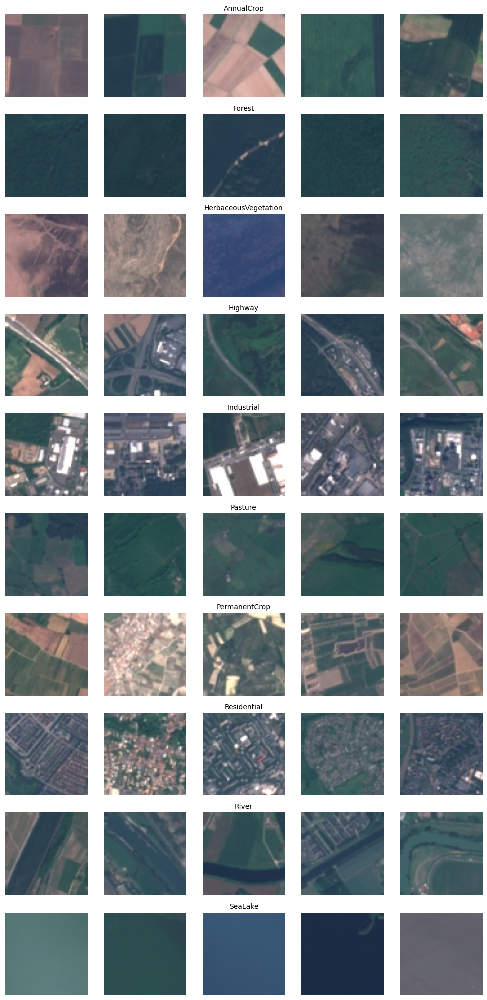

In [13]:
# create a plot for each class
n_classes = samples['cls_name'].nunique()

# color plots
fig, axes = plt.subplots(n_classes, 5, figsize=(10, 2*n_classes))

for idx, (cls, group) in enumerate(samples.groupby('cls_name')):
    for j, (_, row) in enumerate(group.iterrows()):
        # create a boolean mask in df
        mask = train_df['file_name'] == row['file_name']
        # get indices where the mask is True
        indices = train_df.index[mask]
        # use indices to access to image RGB arrays
        img = train_imgs[indices[0]]
        axes[idx, j].imshow(img)
        axes[idx, j].axis('off')
        if j == 2:
            axes[idx, j].set_title(cls, fontsize=10)

plt.tight_layout()
plt.show()

# Color Feature Extraction

Standard RGB image encoding uses 8 bits per channel to store each individual pixel's color, which means that $2^{24} \approx 16.8$ million possible colors can be represented. Even with the relatively small image sizes we are working with (64 x 64 px), we need ways to compress the vast range of the RGB color space into a smaller representation that can meaningfully capture the color content within each image. We selected the following two approaches to accomplish this:  

1.   Color Histogram for Average RGB Channels
2.   K-Means Color Bin Histograms




## Color Histograms for Average RGB values per Image

The first set of feature vectors we gathered were the Average RGB pixel values per image.  To understand how colors differ among labels, we averaged each pixel value across all images in each label. This gave us an “average” image per label, which we then plotted the color histograms of, shown below. There was a lot of variability in colors between the labels. The image below shows the histograms for 6 key labels. We observed a variety of pixel values in Industrial, which is consistent due to Industrial images containing many buildings. However, the other images showed distinct peaks of specific pixel values per color channel.

0 Industrial


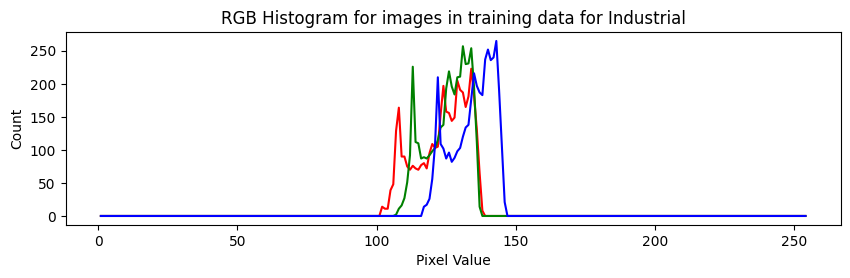


1 Residential


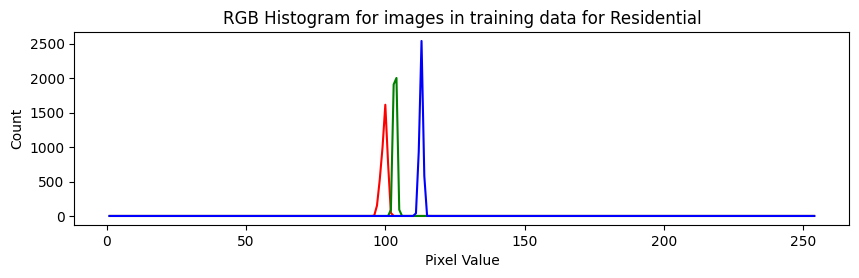


2 Highway


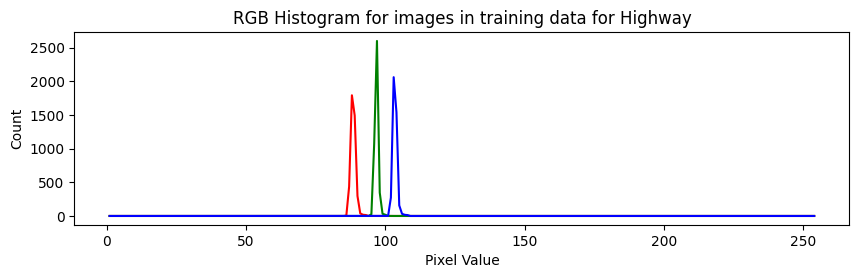


3 AnnualCrop


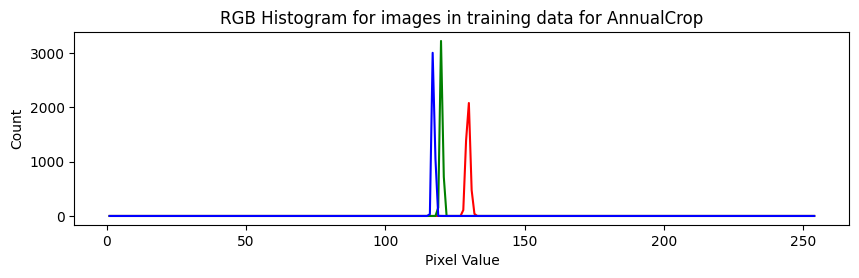


4 PermanentCrop


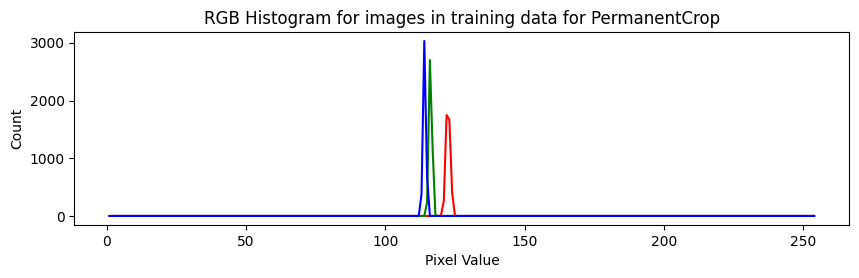


5 Pasture


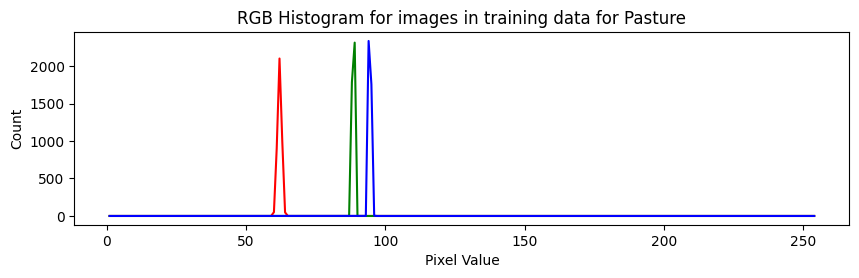


6 HerbaceousVegetation


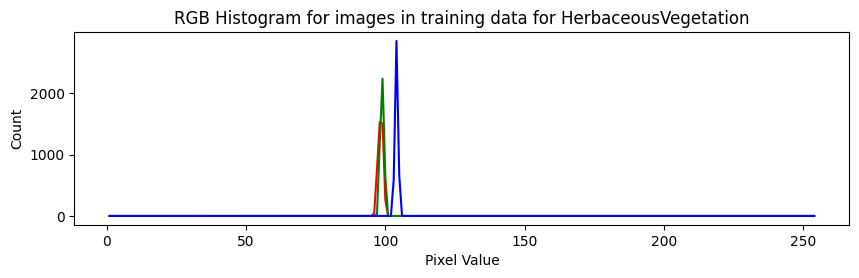


7 Forest


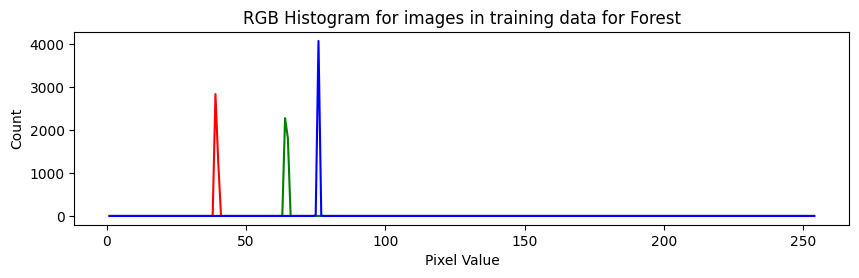


8 River


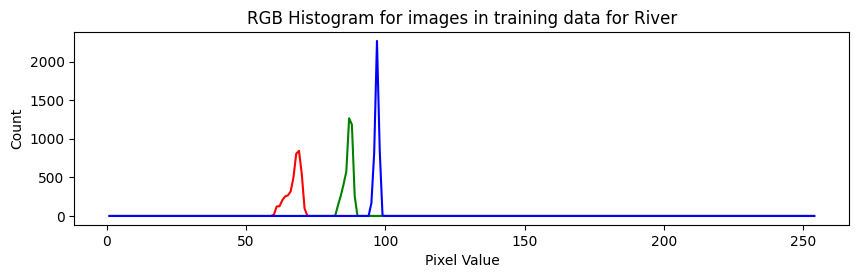


9 SeaLake


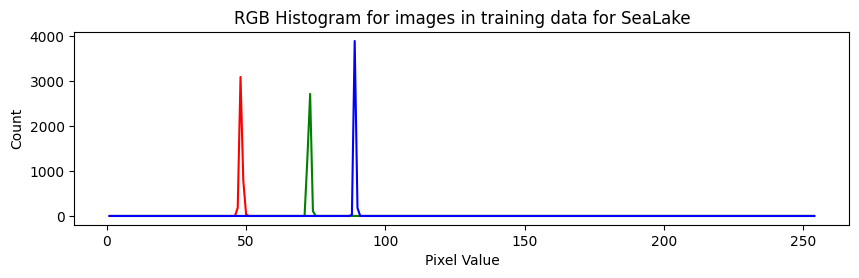

In [ ]:
import cv2
# initialize the array of average RGB values
all_hist_comb = np.zeros((254,3,10))

# iterate each class name and label
for label_id, label in enumerate(train_df.class_name.unique()):
  print(label_id ,label)
  try:
    # get the subset of each class
    train_subset = train_df[train_df.class_name==label]
    train_imgs_subset = train_imgs[train_subset.index]
    # flatten all pixels, keep RGB channels
    train_pixels_subset = train_imgs_subset.reshape(-1, train_imgs_subset.shape[-1])

    # take average of each pixel value per color channel
    avg_pixel_values = np.around(np.mean(train_imgs_subset, axis=0)).astype(int) ## should result in a single 3 channel "average" image

    # plot the color histogram for each channel
    plt.figure(figsize=(10,2.5))
    for channel, c in zip(range(3), 'rgb'):
        hist,bins = np.histogram(avg_pixel_values[:,:,channel], bins=range(0,256))
        all_hist_comb[:,channel, label_id] = hist[1:]
        plt.plot(bins[1:-1], hist[1:], c=c)
        plt.title("RGB Histogram for images in training data for "+ label)
        plt.xlabel("Pixel Value")
        plt.ylabel("Count")

    plt.show()
    print("")
  except:
    print("Issue with ", label)

In [ ]:
train_avg_pixels_feat_vec = np.mean(train_imgs, axis=(1,2))
val_avg_pixels_feat_vec = np.mean(val_imgs, axis=(1,2))
test_avg_pixels_feat_vec = np.mean(test_imgs, axis=(1,2))

# np.save(os.path.join(drive_path, 'data/train/avg_pixel_values'), train_avg_pixels_feat_vec)
# np.save(os.path.join(drive_path, 'data/val/avg_pixel_values'), val_avg_pixels_feat_vec)
# np.save(os.path.join(drive_path, 'data/test/avg_pixel_values'), test_avg_pixels_feat_vec)

In [ ]:
# load avgerage RGB per image for train, val, test
# each image has three values
train_avg_pixels_feat_vec = np.load(os.path.join(drive_path, 'data/train/avg_pixel_values.npy'))
val_avg_pixels_feat_vec = np.load(os.path.join(drive_path, 'data/val/avg_pixel_values'))
test_avg_pixels_feat_vec = np.load(os.path.join(drive_path, 'data/test/avg_pixel_values'))

In [ ]:
pd.DataFrame(train_avg_pixels_feat_vec, columns = ["R", "G", "B"]).describe()

,R,G,B
count,18900.000000,18900.000000,18900.000000
mean,87.898859,97.008021,104.010815
std,43.104372,28.233878,23.333093
min,22.274902,38.074951,57.098389
25%,53.438965,78.357544,85.374512
50%,80.593506,93.467041,101.275391
75%,114.159912,114.106750,119.319397
max,253.770996,209.332031,204.489990


## K-means Color Bin Histograms (LAB)

K-Means is a popular clustering algorithm that partitions data into distinct, non-overlapping clusters based on their features. This makes it a natural choice for compressing color information in images, as it allows us to reduce the 16.8M possible pixel values in RGB space down to the most representative k color bins within our dataset.

To perform K-Means on the training dataset, we first flatten the training image RGB array to create a 2D array with the first dimension representing each pixel and the second dimension representing the RGB values. These are then converted into the CIELAB color space, which has better perceptual uniformity compared to RGB. The process results in more than 77 million pixels in the training images as shown below.

The standard K-Means algorithm is prohibitively computationally expensive to run on a dataset of this size, so instead we opted for MiniBatchKMeans, which uses small, random batches of data for each iteration of the clustering process, significantly reducing computation time and memory usage.

We selected k = 64, which gives us 64 discrete color bins representing the overall color palette of the training images. To convert this into a usable image feature for modeling, all LAB pixels within an image are assigned to the closest K-Means color bin, then we calculate the proportions for each bin to end up with a final 64-dimensional vector.

In [ ]:
# # prepare image RGB arrays for K-means
# train_pixels = train_imgs.reshape(-1, train_imgs.shape[-1])
# train_pixels_lab = rgb2lab(train_pixels)
# train_pixel_labels = np.repeat(train_labels, 64 * 64)

# val_pixels = val_imgs.reshape(-1, val_imgs.shape[-1])
# val_pixels_lab = rgb2lab(val_pixels)
# val_pixel_labels = np.repeat(val_labels, 64 * 64)

# print('Size of reshaped train image RGB array:', train_pixels.shape)
# print('Size of reshaped train class ID:', train_pixel_labels.shape)

In [ ]:
N_CLUSTERS = 64

In [ ]:
## Run K-Means clustering on training image pixels
# km = MiniBatchKMeans(
#     n_clusters=N_CLUSTERS,
#     max_iter=50,
#     batch_size=32000,
#     verbose=0,
# )

# km.fit(train_pixels_lab)

with open(os.path.join(drive_path, 'models/kmeans_colors.pkl'), 'rb') as f:
    km = pickle.load(f)

In [ ]:
# # Instantiate UMAP object for use in creating a natural order of color bins
# umap_ = UMAP(
#     n_components=1,
#     n_neighbors=10,
#     min_dist=0.,
#     metric='euclidean',
#     # n_epochs=2500,
# )

# # Fit UMAP object on cluster centers
# colors_emb = umap_.fit_transform(
#     km.cluster_centers_,
#     #y=class_labels
# )

# # Sort cluster centers by their 1-D UMAP embeddings
# sorted_color_idx = np.argsort(colors_emb.flatten())

# # Assign reordered cluster centers to K-Means object
# cluster_centers_sorted = km.cluster_centers_[sorted_color_idx,:]
# km.cluster_centers_ = cluster_centers_sorted

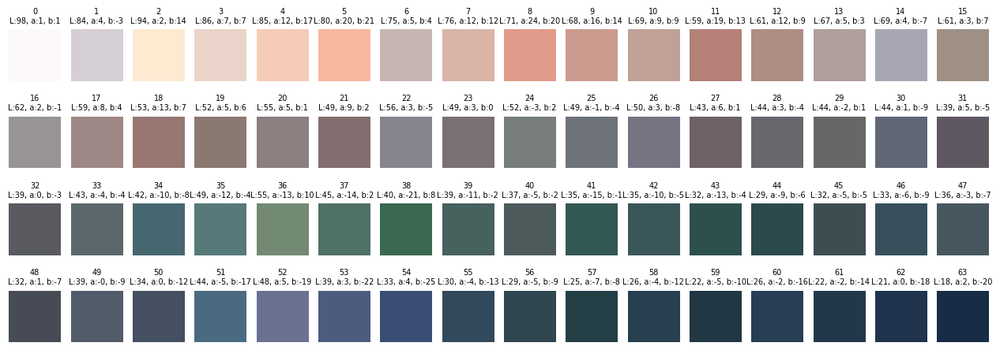

In [ ]:
# plot 64 cluster centers RGB color
plot_rows = 4
plot_cols = -(-N_CLUSTERS // plot_rows)
fig, axs = plt.subplots(plot_rows, plot_cols, figsize=(16, 5.5))
for axs_row in axs:
    for ax in axs_row:
        ax.axis('off')

for i, centroid in enumerate(km.cluster_centers_):
  centroid_img = np.zeros((50, 50, 3), dtype=np.float32)
  centroid_rgb = lab2rgb(centroid)
  centroid_img[:,:,:] = centroid_rgb
  axs.flatten()[i].imshow(centroid_img)
  axs.flatten()[i].set_title(
      label=f'{i}\nL:{centroid[0]:.0f}, a:{centroid[1]:.0f}, b:{centroid[2]:.0f}',
      fontdict={'fontsize': 7},
  )

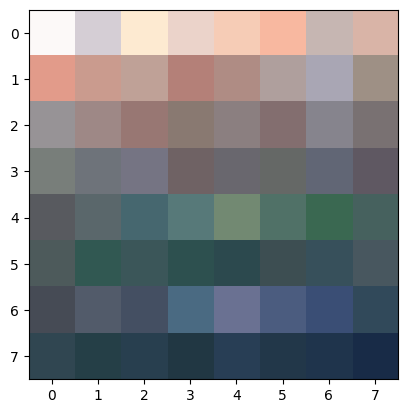

In [ ]:
# plot 64 cluster centers RGB value in one figure
kmeans_palette_img = np.zeros((8, 8, 3), dtype=np.float32)

for i, centroid in enumerate(km.cluster_centers_):
  centroid_rgb = lab2rgb(centroid)
  row_num = i // 8
  col_num = i % 8
  kmeans_palette_img[row_num, col_num, :] = centroid_rgb

plt.imshow(kmeans_palette_img)

In [ ]:
# km.labels_ = None
# with open(os.path.join(drive_path, 'models/kmeans_colors.pkl'), 'wb') as f:
#     pickle.dump(km, f)

In [ ]:
# Extract color histogram, RGB centroids, and K-Means quantization from image
def apply_kmeans_to_img(img, kmeans):
  # flatten image pixels, convert RGB to Lab, use kmean to cluster each pixel to 1~64
  img_pixels = img.reshape(-1, img.shape[-1])
  img_pixels_lab = rgb2lab(img_pixels)
  img_pixel_labels = kmeans.predict(img_pixels_lab)

  # count cluster frequency of the image
  color_freqs = np.zeros(kmeans.n_clusters)
  for color in range(kmeans.n_clusters):
    color_freqs[color] = np.sum(img_pixel_labels == color)
  color_freqs /= img_pixels.shape[0]

  # assing clustered RGB to the image
  centroids_rgb = np.float32(lab2rgb(kmeans.cluster_centers_))
  img_pixels_clustered = np.stack([centroids_rgb[i] for i in img_pixel_labels])
  kmeans_img = img_pixels_clustered.reshape(img.shape)

  return color_freqs, centroids_rgb, kmeans_img

# Extract color histogram from image
def get_kmeans_color_freqs(img, kmeans):
  img_pixels = img.reshape(-1, img.shape[-1])
  img_pixels_lab = rgb2lab(img_pixels)
  img_pixel_labels = kmeans.predict(img_pixels_lab)

  color_freqs = np.zeros(kmeans.n_clusters)
  for color in range(kmeans.n_clusters):
    color_freqs[color] = np.sum(img_pixel_labels == color)
  color_freqs /= img_pixels.shape[0]

  return color_freqs


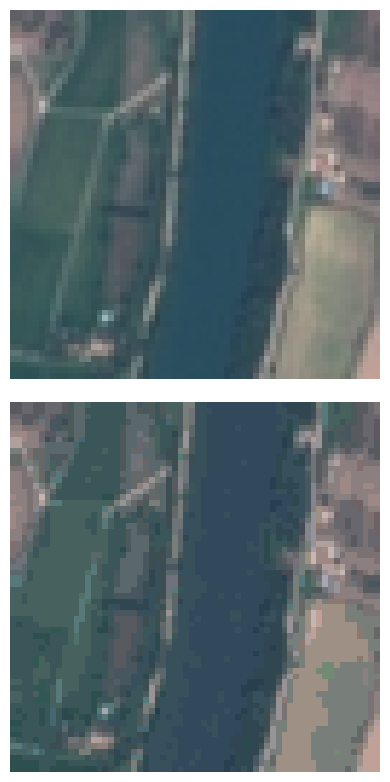

In [ ]:
# Extract features from a sample image & show color-quantized version
sample_img = train_imgs[15513]
color_freqs, centroids_rgb, kmeans_img = apply_kmeans_to_img(sample_img, km)

plt.figure(figsize=(4,8))

plt.subplot(211)
plt.imshow(sample_img)
# plt.title('Original Image')
plt.axis('off')

plt.subplot(212)
plt.imshow(kmeans_img)
# plt.title(f'K-Means Color Quantized - {N_CLUSTERS} Bins')
plt.axis('off')

plt.tight_layout()
plt.show()

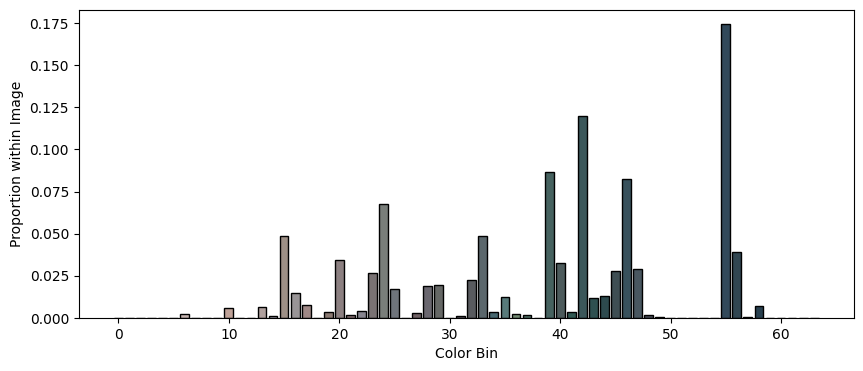

In [ ]:
# Visualization of how often each color bin appears in the sample image
plt.figure(figsize=(10,4))
plt.bar(
    x=range(len(color_freqs)),
    height=color_freqs,
    color=list(centroids_rgb),
    edgecolor='black',
    linewidth=1,
)
plt.xlabel('Color Bin')
plt.ylabel('Proportion within Image')
# plt.title('K-Means Color Bin Frequencies')
plt.show()

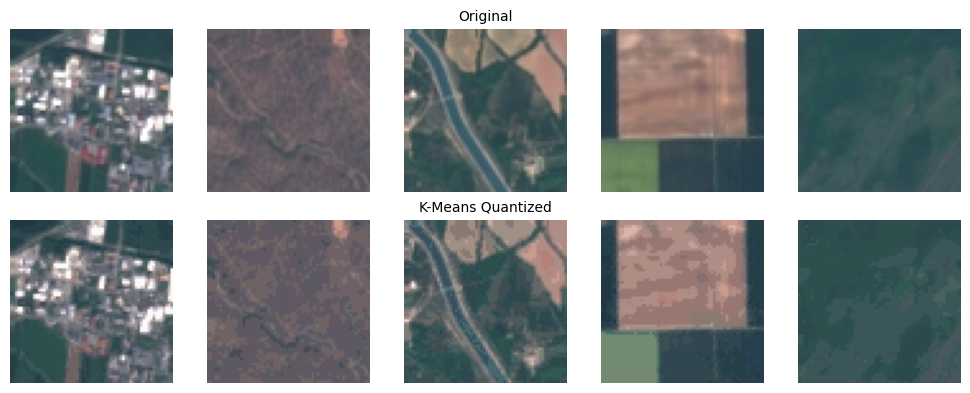

In [ ]:
# apply k-means to sample images and make comparison plot
sample_df = train_df.sample(5)

# color plots
fig, axes = plt.subplots(2, 5, figsize=(10, 4))

for j, (_, row) in enumerate(sample_df.iterrows()):
    # create a boolean mask in df
    mask = train_df['file_name'] == row['file_name']
    # get indices where the mask is True
    indices = train_df.index[mask]
    # use indices to access to image RGB arrays
    img = train_imgs[indices[0]]
    _, _, km_img = apply_kmeans_to_img(img, km)
    axes[0, j].imshow(img)
    axes[0, j].axis('off')
    axes[1, j].imshow(km_img)
    axes[1, j].axis('off')
    if j == 2:
        axes[0, j].set_title('Original', fontsize=10)
        axes[1, j].set_title('K-Means Quantized', fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
# # Extract K-Means color bin histograms from training images
# train_kmeans_hists = np.zeros((train_imgs.shape[0], N_CLUSTERS), dtype=np.float32)
# for i, img in enumerate(train_imgs):
#     color_freqs = get_kmeans_color_freqs(img, km)
#     train_kmeans_hists[i,:] = color_freqs

# # Extract K-Means color bin histograms from validation images
# val_kmeans_hists = np.zeros((val_imgs.shape[0], N_CLUSTERS), dtype=np.float32)
# for i, img in enumerate(val_imgs):
#     color_freqs = get_kmeans_color_freqs(img, km)
#     val_kmeans_hists[i,:] = color_freqs

# # Extract K-Means color bin histograms from test images
# test_kmeans_hists = np.zeros((test_imgs.shape[0], N_CLUSTERS), dtype=np.float32)
# for i, img in enumerate(test_imgs):
#     color_freqs = get_kmeans_color_freqs(img, km)
#     test_kmeans_hists[i,:] = color_freqs

# # Save to file
# np.save(os.path.join(drive_path, 'data/train/kmeans_color_freqs'), train_kmeans_hists)
# np.save(os.path.join(drive_path, 'data/val/kmeans_color_freqs'), val_kmeans_hists)
# np.save(os.path.join(drive_path, 'data/test/kmeans_color_freqs'), test_kmeans_hists)

In [ ]:
# load K-Means color bin histograms
train_kmeans_hists = np.load(os.path.join(drive_path, 'data/train/kmeans_color_freqs.npy'))
val_kmeans_hists = np.load(os.path.join(drive_path, 'data/val/kmeans_color_freqs.npy'))
test_kmeans_hists = np.load(os.path.join(drive_path, 'data/test/kmeans_color_freqs.npy'))
print(train_kmeans_hists.shape)
print(val_kmeans_hists.shape)
print(test_kmeans_hists.shape)

### PCA of K-mean Color Bin Histograms

We apply PCA to the K-mean color bin histograms and visualize the first two components.

In [ ]:
# Apply PCA to histograms
pca = PCA(n_components=2)
train_kmeans_hists_pca = pca.fit_transform(train_kmeans_hists)

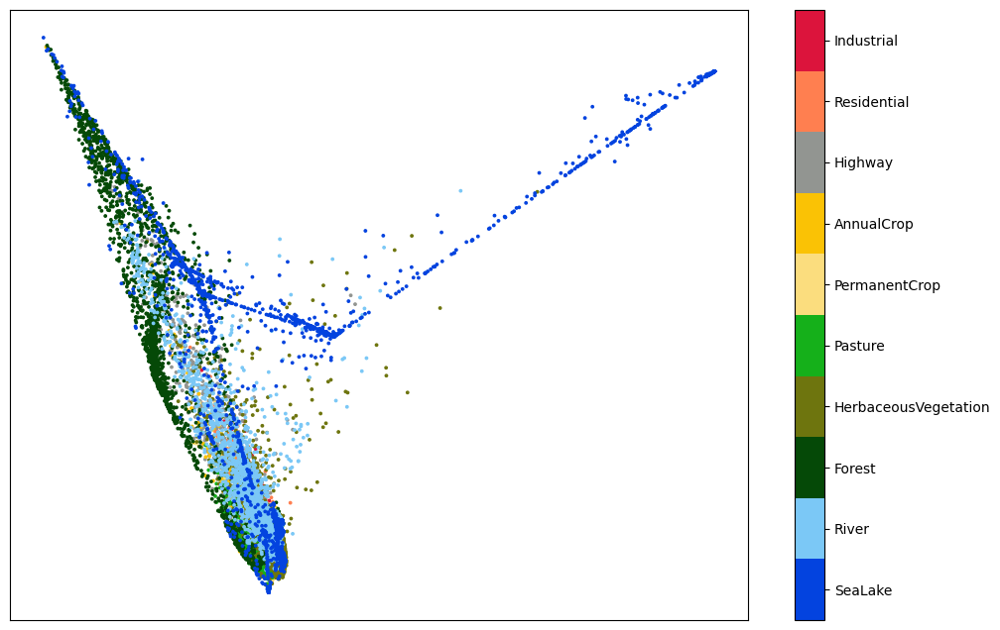

In [ ]:
# scatter plot of PCA components
fig, ax = plt.subplots(1, figsize=(12, 8))
plt.scatter(*train_kmeans_hists_pca.T, s=3, c=(9-train_labels), cmap=cmap2.reversed())
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5, alpha=1.0)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(np.flip(class_names))

### UMAP of K-means Color Bin Histograms

Uniform Manifold Approximation and Projection (UMAP) is a dimension reduction technique that can be used for visualisation similarly to t-SNE, but also for general non-linear dimension reduction.

In [ ]:
umap = UMAP(
    n_components=2,
    n_neighbors=50,
    min_dist=1.,
    metric='euclidean',
    # n_epochs=2500,
)

train_kmeans_hists_umap = umap.fit_transform(train_kmeans_hists)

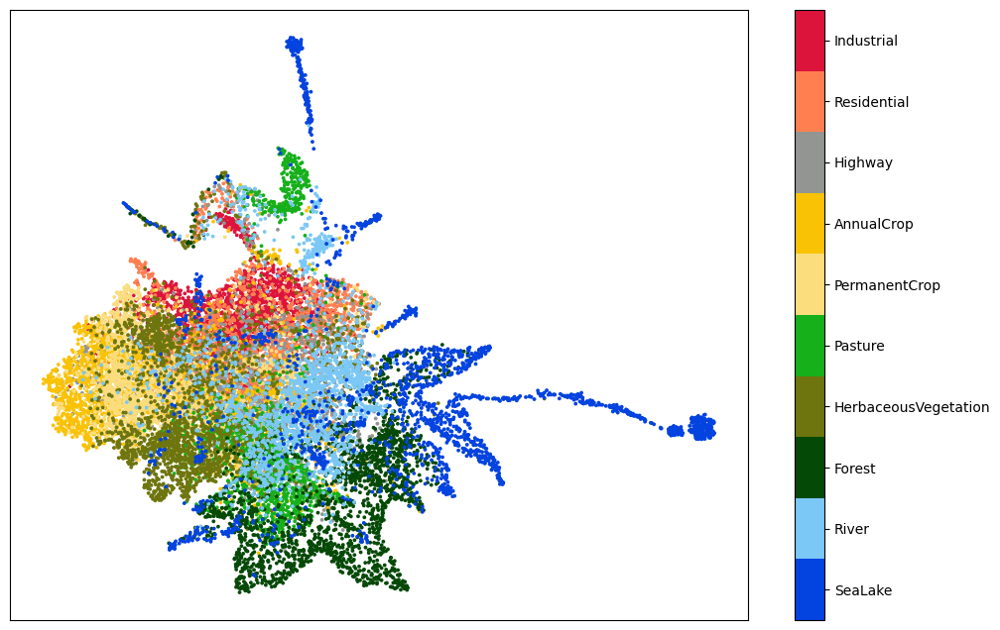

In [ ]:
# scatter plot of UMAP components
fig, ax = plt.subplots(1, figsize=(12, 8))
plt.scatter(*train_kmeans_hists_umap.T, s=3, c=(9-train_labels), cmap=cmap2.reversed())
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5, alpha=1.0)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(np.flip(class_names))

#Texture Feature Extraction

Texture feature extraction is a process in computer vision and image processing where specific characteristics or patterns are identified and extracted from an image. These characteristics are known as texture features. This process is crucial for various applications such as image classification, segmentation, and pattern recognition.

In our study, we focused three methods of texture feature extraction:



1.   Local Binary Patterns (LBP)
2.   Histogram of Oriented Gradients (HOG)
3.   Gray Level Co-occurence Matrx (GLCM)




##Local Binary Patterns (LBP)

Local Binary Patterns (LBP) is a popular feature descriptor used in computer vision and image processing. The method is relatively simple yet very efficient at describing the local spatial patterns and texture of an image.


In [ ]:
from skimage.feature import local_binary_pattern

# Parameters for LBP
radius = 1  # LBP operation radius
n_points = 8 * radius  # Number of points to be considered as neighbors
METHOD = 'ror'  # LBP method: uniform, ror

# Function to apply LBP to an image and return the histogram
def get_lbp_histogram(image):
    lbp = local_binary_pattern(image, n_points, radius, METHOD)
    # Assuming that each (flat) histogram will have a number of bins equal to the number of possible patterns
    bins = int(lbp.max() + 1)
    #bins = 59
    # Calculate the LBP histogram
    histogram, _ = np.histogram(lbp.ravel(), density=True, bins=bins, range=(0, bins))
    return histogram




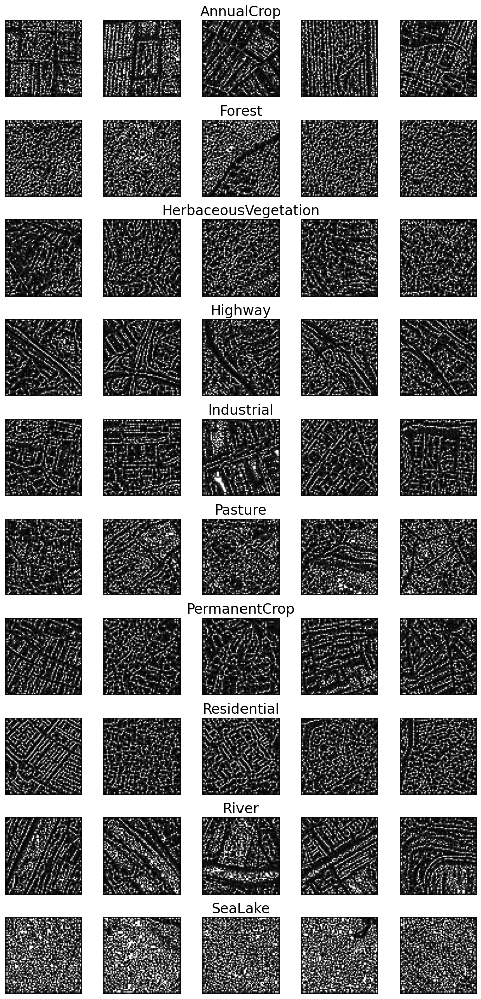

In [ ]:
# Create LBP plots for each class
fig, axes = plt.subplots(n_classes, 5, figsize=(10, 2*n_classes))

for idx, (cls, group) in enumerate(samples.groupby('cls_name')):
    for j, (_, row) in enumerate(group.iterrows()):
        # create a boolean mask in df
        mask = train_df['file_name'] == row['file_name']
        # get indices where the mask is True
        indices = train_df.index[mask]
        # use indices to access to image RGB arrays (64,64,3)
        img = train_imgs[indices[0]]
        # get lbp histogram, need to use grayscale image
        lbp = local_binary_pattern(rgb2gray(img), n_points, radius, METHOD)
        axes[idx, j].imshow(lbp, cmap='gray')
        axes[idx, j].axis('off')
        if j == 2:
            axes[idx, j].set_title(cls, fontsize=20)

plt.tight_layout()
plt.show()

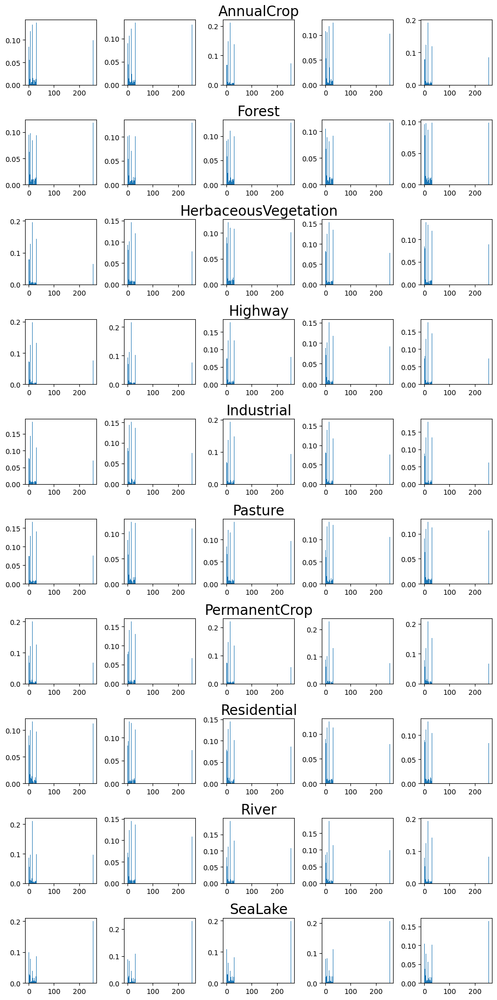

In [ ]:
# Create a plot for each class with LBP histogram
fig, axes = plt.subplots(n_classes, 5, figsize=(10, 2*n_classes))

for idx, (cls, group) in enumerate(samples.groupby('cls_name')):
    for j, (_, row) in enumerate(group.iterrows()):
        # create a boolean mask in df
        mask = train_df['file_name'] == row['file_name']
        # get indices where the mask is True
        indices = train_df.index[mask]
        # use indices to access to image RGB arrays (64,64,3)
        img = train_imgs[indices[0]]
        lbp_histogram = get_lbp_histogram(rgb2gray(img))
        axes[idx, j].bar(range(len(lbp_histogram)), lbp_histogram)
        if j == 2:
            axes[idx, j].set_title(cls, fontsize=20)

plt.tight_layout()
plt.show()

##Histogram of Oriented Gradients (HOG)

Histogram of Oriented Gradients (HOG) is a feature descriptor used extensively in computer vision and image processing for the purpose of object detection. It was notably used in pedestrian detection in the context of computer vision. The basic idea behind HOG is to characterize the appearance and shape of a local area of an image by the distribution of intensity gradients or edge directions.  

In [ ]:
from skimage.feature import hog
from skimage import exposure


# Setup parameters for HOG function
n_orientation = 9
n_pxl_per_cel = 8
n_cel_per_blk = 2

# Function to apply HOG to an image and return the HOG image
def get_hog_image(image):
    # Calculate HOG features and HOG image
    fd, hog_image = hog(image, orientations=n_orientation, pixels_per_cell=(n_pxl_per_cel, n_pxl_per_cel),
                        cells_per_block=(n_cel_per_blk, n_cel_per_blk), visualize=True, feature_vector=True)

    # Rescale histogram for better display
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    #hog_image_rescaled = hog_image


    return fd, hog_image_rescaled

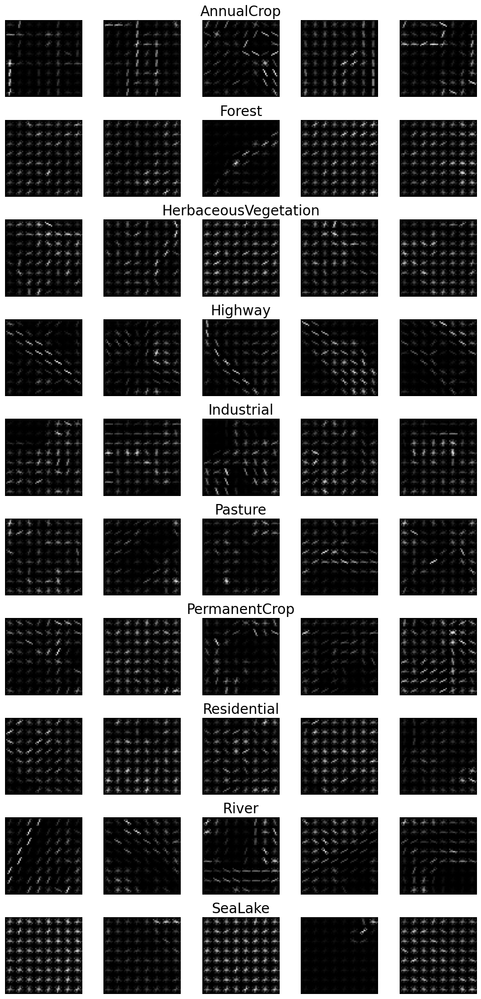

In [ ]:
# Create HOG image plots for each class
fig, axes = plt.subplots(n_classes, 5, figsize=(10, 2*n_classes))

for idx, (cls, group) in enumerate(samples.groupby('cls_name')):
    for j, (_, row) in enumerate(group.iterrows()):
        # create a boolean mask in df
        mask = train_df['file_name'] == row['file_name']
        # get indices where the mask is True
        indices = train_df.index[mask]
        # use indices to access to image RGB arrays (64,64,3)
        img = train_imgs[indices[0]]
        _, hog_img = get_hog_image(rgb2gray(img))
        axes[idx, j].imshow(hog_img, cmap='gray')
        axes[idx, j].axis('off')
        if j == 2:
            axes[idx, j].set_title(cls, fontsize=20)

plt.tight_layout()
plt.show()

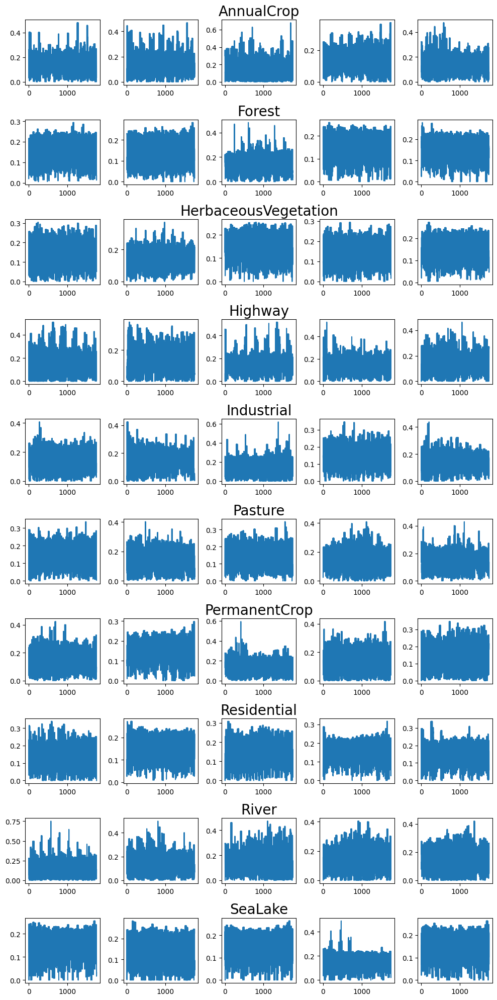

In [ ]:
# Create HOG image plots for each class
fig, axes = plt.subplots(n_classes, 5, figsize=(10, 2*n_classes))

for idx, (cls, group) in enumerate(samples.groupby('cls_name')):
    for j, (_, row) in enumerate(group.iterrows()):
        # create a boolean mask in df
        mask = train_df['file_name'] == row['file_name']
        # get indices where the mask is True
        indices = train_df.index[mask]
        # use indices to access to image RGB arrays (64,64,3)
        img = train_imgs[indices[0]]
        fd , _ = get_hog_image(rgb2gray(img))
        axes[idx, j].plot(fd)
        #axes[idx, j].axis('off')
        if j == 2:
            axes[idx, j].set_title(cls, fontsize=20)

plt.tight_layout()
plt.show()

##Gray Level Co-occurrence Matrix (GLCM)

The Gray Level Co-occurrence Matrix (GLCM) is a statistical method of examining texture that considers the spatial relationship of pixels. It's a powerful tool in image processing for texture analysis, used in various applications like medical imaging, remote sensing, and machine vision.

### Definition
The GLCM is a matrix where the number of rows and columns is equal to the number of gray levels, $G$, in the image. For example, if the number of gray levels is 256, the matrix shape will be 256 x 256. The matrix element $P(i, j | Δx, Δy)$ is the relative frequency with which two pixels, separated by a pixel distance $(Δx, Δy)$, occur within a given neighborhood, one with intensity $i$ and the other with intensity $j$.

### Construction
- Choose a pixel distance and direction.
- For each pair of pixels in the image separated by the chosen distance and direction, increment the value of the matrix element corresponding to the gray levels of these pixels.

The table below shows the pixel distance = 1 and the direction = [0,45,90,135, 180, 225, 270, 315]. For a symmetrical Gray Level Co-occurrence Maxtrix, we just need to include angles [0,45,90,135].  

| 135° | 90° | 45° |
|------|-----|-----|
| 180° |  Center  |  0° |
| 225° | 270°| 315°|


### Properties of GLCM

The GLCM itself is useful, but it's often the statistical measures derived from it that are most useful. Commonly used properties include:

1. **Contrast**: Measures the local variations in the GLCM.
   - Formula: $∑_{i, j} P(i, j) (i - j)^2$

2. **Dissimilarity**: Measures the local variations in the GLCM, similar to Contrast, but takes the absolute difference, making it less sensitive to larger differences.
   - Formula: $∑_{i, j} P(i, j) |i - j|$

3. **Homogeneity**: Measures the closeness of the distribution of elements in the GLCM to the GLCM diagonal.
   - Formula: $∑_{i, j} P(i, j) / (1 + (i - j)^2)$

4. **Energy** (or Angular Second Moment): Sum of squared elements in the GLCM.
   - Formula: $∑_{i, j} P(i, j)^2$


5. **Correlation**: Measures how correlated a pixel is to its neighbor over the whole image.
   - Formula: $∑_{i, j} P(i, j) ((i - μ_i)(j - μ_j)) / (σ_i σ_j)$
   - $μ$ and $σ$ are the mean and standard deviation of the respective rows or columns.

6. **Entropy**: Measures the randomness in the image texture.
   - Formula: $-∑_{i, j} P(i, j) log(P(i, j))$

These properties can be used to describe the texture of an image, which is particularly useful in image classification and segmentation tasks. The specific choice of properties and how they are calculated can vary based on the application.





In [ ]:
from skimage.feature import graycomatrix, graycoprops
# GLCM parameters
# distances: [1] - pixel pairs that are one pixel apart
glcm_dist = [1]
# angles: [0, 45, 90, 135, 180, 225, 270, 315] - pixel pairs at these angles
# for symmetrical GLCM, [0, 45, 90, 135] is equivalent to [180, 225, 270, 315]
glcm_angl = [0, np.pi/4, np.pi/2, 3*np.pi/4] #, 4*np.pi/4, 5*np.pi/4, 6*np.pi/4, 7*np.pi/4]
# levels: the number of gray levels in the image, size of the glcm matrix entropy
n_levels = 256
n_glcm_fts = len(glcm_dist) * len(glcm_angl) * 5

def get_glcm_features(image) :
  # Scale the grayscale image to the range [0, 255] and convert to uint8
  gray_image_scaled = (rgb2gray(image) * 255).astype(np.uint8)
  # Compute GLCM
  glcm = graycomatrix(gray_image_scaled, distances=glcm_dist, angles=glcm_angl,
                    levels=n_levels, symmetric=True, normed=True)

  # Compute GLCM properties
  contrast = graycoprops(glcm, 'contrast')
  dissimilarity = graycoprops(glcm, 'dissimilarity')
  homogeneity = graycoprops(glcm, 'homogeneity')
  energy = graycoprops(glcm, 'energy')
  correlation = graycoprops(glcm, 'correlation')
  #entropy = -np.sum(glcm * np.log(glcm + np.finfo(float).eps), axis=(2,3))

  return contrast, dissimilarity, homogeneity, energy, correlation#, entropy

def get_glcm_features2(image) :
  # Scale the grayscale image to the range [0, 255] and convert to uint8
  gray_image_scaled = (rgb2gray(image) * 255).astype(np.uint8)
  # Compute GLCM
  glcm = graycomatrix(gray_image_scaled, distances=glcm_dist, angles=glcm_angl,
                    levels=n_levels, symmetric=True, normed=True)

  # Compute GLCM properties
  contrast = graycoprops(glcm, 'contrast')
  dissimilarity = graycoprops(glcm, 'dissimilarity')
  homogeneity = graycoprops(glcm, 'homogeneity')
  energy = graycoprops(glcm, 'energy')
  correlation = graycoprops(glcm, 'correlation')

  return np.hstack([
      contrast,
      dissimilarity,
      homogeneity,
      energy,
      correlation
  ]).squeeze()

In [ ]:
# # Extract GLCM features from training images
# train_glcm_fts = np.zeros((train_imgs.shape[0], n_glcm_fts), dtype=np.float32)
# for i, img in enumerate(train_imgs):
#     if i % 1000 == 0: print(f'Train image {i}')
#     glcm_fts = get_glcm_features2(img)
#     train_glcm_fts[i,:] = glcm_fts

# # Extract GLCM features from validation images
# val_glcm_fts = np.zeros((val_imgs.shape[0], n_glcm_fts), dtype=np.float32)
# for i, img in enumerate(val_imgs):
#     if i % 1000 == 0: print(f'Val image {i}')
#     glcm_fts = get_glcm_features2(img)
#     val_glcm_fts[i,:] = glcm_fts

# # Extract GLCM features from test images
# test_glcm_fts = np.zeros((test_imgs.shape[0], n_glcm_fts), dtype=np.float32)
# for i, img in enumerate(test_imgs):
#     if i % 1000 == 0: print(f'Test image {i}')
#     glcm_fts = get_glcm_features2(img)
#     test_glcm_fts[i,:] = glcm_fts

# # Save to file
# np.save(os.path.join(drive_path, 'data/train/glcm_fts'), train_glcm_fts)
# np.save(os.path.join(drive_path, 'data/val/glcm_fts'), val_glcm_fts)
# np.save(os.path.join(drive_path, 'data/test/glcm_fts'), test_glcm_fts)

In [ ]:
train_glcm_fts = np.load(os.path.join(drive_path, 'data/train/glcm_fts.npy'))
val_glcm_fts = np.load(os.path.join(drive_path, 'data/val/glcm_fts.npy'))
test_glcm_fts = np.load(os.path.join(drive_path, 'data/test/glcm_fts.npy'))

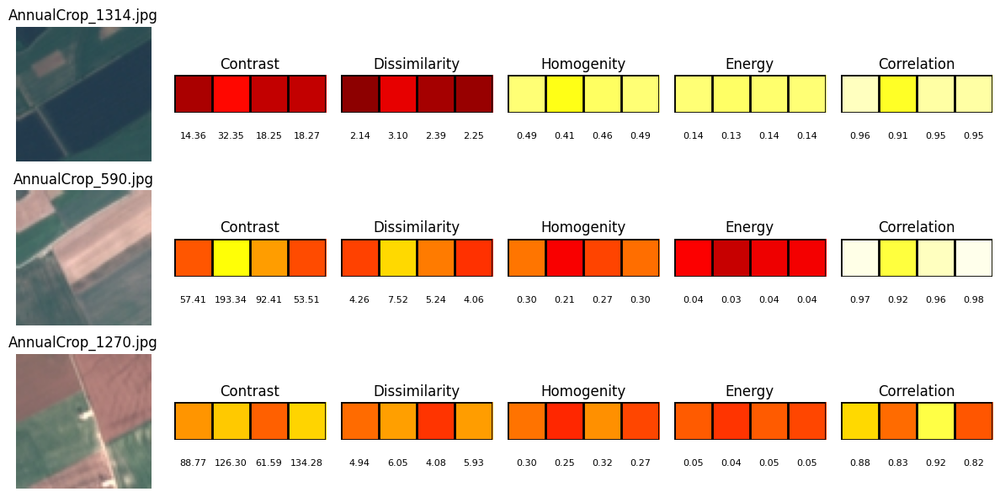

In [ ]:
# Create GLCM properties plots for each class
sample_df = train_df[train_df['class_name'] == 'AnnualCrop'].sample(3)
# define plot function for GLCM properties
def plot_glcm_property(axes, j, n , in_prop) :
    # plot property
    in_prop_ptiles = np.array([
        np.mean((train_glcm_fts[:,((n-1)*4):(n*4)] < x)) for x in in_prop.flatten()
    ])
    axes[j, n].imshow(
        np.expand_dims(in_prop_ptiles, axis=0),
        cmap='hot',
        vmin=0.,
        vmax=1.,
    )

    axes[j, n].axis('off')
    # add values
    for i, value in enumerate(in_prop[0]):
      axes[j, n].text(i, 1, f'{value:.2f}', fontsize=8, ha='center', va='top', transform=axes[j, n].transData)
    # Add boundary lines
    num_rows, num_cols = in_prop.shape
    for i in range(num_rows + 1):
        axes[j, n].axhline(i - 0.5, lw=2, color='black')  # Horizontal lines
    for i in range(num_cols + 1):
        axes[j, n].axvline(i - 0.5, lw=2, color='black')  # Vertical lines


# color plots
fig, axes = plt.subplots(3, 6, figsize=(12, 6))
img_list = []
for j, (_, row) in enumerate(sample_df.iterrows()):
    # create a boolean mask in df
    mask = train_df['file_name'] == row['file_name']
    # get indices where the mask is True
    indices = train_df.index[mask]
    # use indices to access to image RGB arrays
    img = train_imgs[indices[0]]
    img_list.append(img)
    contrast, dissim, homogen, energy, correlation = get_glcm_features(img)

    # origional image
    axes[j, 0].imshow(img)
    axes[j, 0].axis('off')
    # contrast
    plot_glcm_property(axes, j, 1 , contrast)
    # dissimilarity
    plot_glcm_property(axes, j, 2 , dissim)
    # homogenity
    plot_glcm_property(axes, j, 3 , homogen)
    # energy
    plot_glcm_property(axes, j, 4 , energy)
    # correlation
    plot_glcm_property(axes, j, 5 , correlation)

    # set titles
    axes[j,0].set_title(row['file_name'])
    axes[j,1].set_title('Contrast')
    axes[j,2].set_title('Dissimilarity')
    axes[j,3].set_title('Homogenity')
    axes[j,4].set_title('Energy')
    axes[j,5].set_title('Correlation')

plt.tight_layout()
plt.show()


In [ ]:
# img = plt.imshow(np.array([[0,1]]), cmap="hot", vmin=0., vmax=1.)
# img.set_visible(False)

# plt.colorbar(orientation="vertical", extend='both', ticks=[0.05, 0.25, 0.5, 0.75, 0.95])

In [ ]:
print(contrast)
print(dissim)
print(homogen)
print(energy)
print(correlation)


[[ 88.76785714 126.30335097  61.59027778 134.27790375]]
[[4.93650794 6.04635928 4.07886905 5.93172084]]
[[0.30137621 0.24806836 0.31898275 0.27025664]]
[[0.05029711 0.04450121 0.05053928 0.04713703]]
[[0.88113666 0.83126676 0.9172328  0.82059594]]


### PCA of GLCM

We apply PCA to the GLCM property vector and visualize the first two components.

In [ ]:
pca = PCA(n_components=2)
train_glcm_fts_pca = pca.fit_transform(train_glcm_fts)

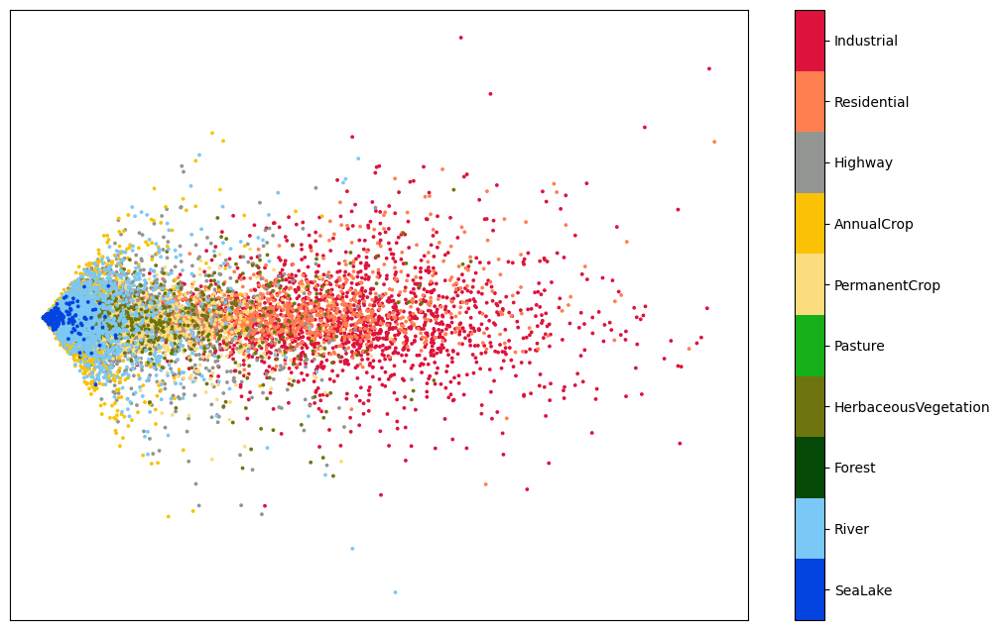

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 8))
plt.scatter(*train_glcm_fts_pca.T, s=3, c=(9-train_labels), cmap=cmap2.reversed())
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5, alpha=1.0)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(np.flip(class_names))

###UMAP of GLCM

We also apply the UMAP to the GLCM property vector and visualize the first two components.

In [ ]:
umap = UMAP(
    n_components=2,
    n_neighbors=50,
    min_dist=1.,
    metric='euclidean',
    # n_epochs=2500,
)

train_glcm_fts_umap = umap.fit_transform(train_glcm_fts)

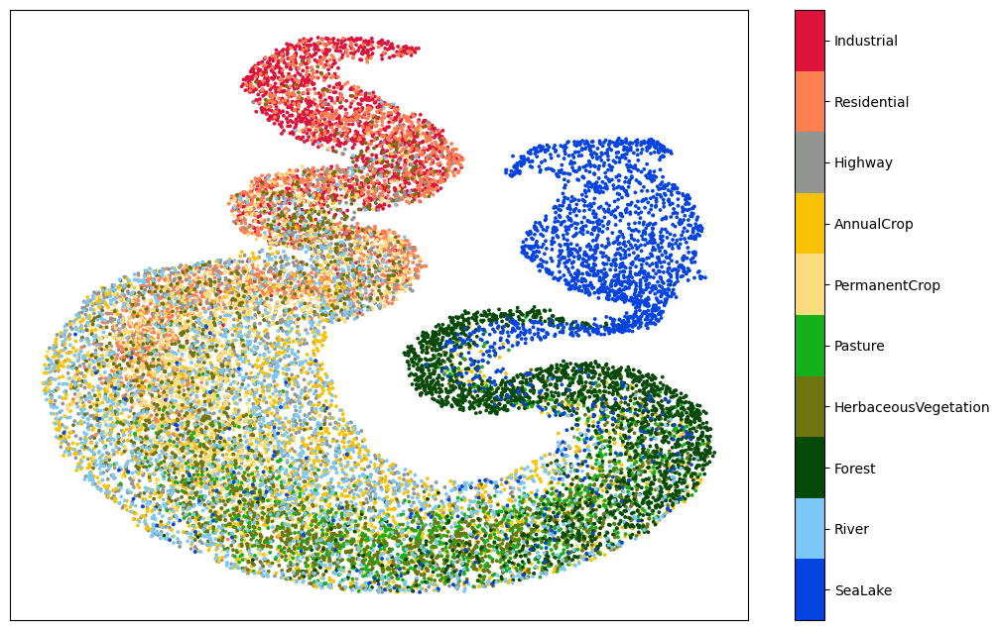

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 8))
plt.scatter(*train_glcm_fts_umap.T, s=3, c=(9-train_labels), cmap=cmap2.reversed())
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5, alpha=1.0)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(np.flip(class_names))

# EfficientNet

EfficientNet is a type of convolutional neural network (CNN) architecture that was introduced by Google researchers in 2019. It's designed to provide a scalable and efficient solution for model scaling in deep learning.

Pre-trained EfficientNet models are often used for feature extraction in transfer learning scenarios. The model's knowledge from the original dataset can be leveraged to extract relevant features from new, possibly quite different, datasets.

In our study, we use a pre-trained EfficientNet model to create complex features and apply PCA and UMAP.  



## Download Pre-Trained Model

In [ ]:
effnet = tf.keras.applications.EfficientNetV2B3(
    include_top=False,
    weights="imagenet",
    pooling='avg',
    include_preprocessing=True,
)
effnet.trainable=False
effnet.summary()

52606240/52606240 [==============================] - 1s 0us/step
Model: "efficientnetv2-b3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, None, None, 3)        0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, None, None, 3)        0         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 stem_conv (Conv2

## Create, Save, or Load EfficientNet Features

In [ ]:
# train_img_fts = effnet.predict(
#     x=train_imgs,
#     batch_size=256
# )
# train_img_fts.shape

In [ ]:
# np.save(os.path.join(drive_path, 'data/train/effnet_fts.npy'), train_img_fts)

In [ ]:
# val_img_fts = effnet.predict(
#     x=val_imgs,
#     batch_size=256
# )
# val_img_fts.shape

In [ ]:
# np.save(os.path.join(drive_path, 'data/val/effnet_fts.npy'), val_img_fts)

In [ ]:
# test_img_fts = effnet.predict(
#     x=test_imgs,
#     batch_size=256
# )
# test_img_fts.shape

In [ ]:
# np.save(os.path.join(drive_path, 'data/test/effnet_fts.npy'), test_img_fts)

In [ ]:
train_effnet_fts = np.load(os.path.join(drive_path, 'data/train/effnet_fts.npy'))
val_effnet_fts = np.load(os.path.join(drive_path, 'data/val/effnet_fts.npy'))
test_effnet_fts = np.load(os.path.join(drive_path, 'data/test/effnet_fts.npy'))

## Define & Train Encoder/Classifier

In [ ]:
# tf.keras.backend.clear_session()
# n_input_fts = 1536

# model = Sequential(
#     [
#         layers.BatchNormalization(name='input_bn'),
#         layers.GaussianNoise(0.25, name='input_gauss_noise'),
#         layers.Dropout(0.5, name='input_dropout'),

#         layers.Dense(
#             64,
#             bias_initializer = tf.keras.initializers.Constant(value=0.5),
#             name='dense1',
#         ),
#         layers.BatchNormalization(
#             name='dense1_bn',
#         ),
#         layers.GaussianNoise(0.25, name='dense1_gauss_noise'),
#         layers.Dropout(0.2, name='dense1_dropout'),
#         layers.ReLU(name='dense1_relu'),

#         layers.Dense(
#             10,
#             kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.05),
#             name='layer_out',
#         )
#     ]
# )

# model.build(input_shape=(None, n_input_fts))
# encoder = Model(model.input, model.get_layer('dense1_relu').output)

# model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_bn (BatchNormalizati  (None, 1536)              6144      
 on)                                                             
                                                                 
 input_gauss_noise (Gaussia  (None, 1536)              0         
 nNoise)                                                         
                                                                 
 input_dropout (Dropout)     (None, 1536)              0         
                                                                 
 dense1 (Dense)              (None, 64)                98368     
                                                                 
 dense1_bn (BatchNormalizat  (None, 64)                256       
 ion)                                                            
                                                        

In [ ]:
# sample_fts = train_effnet_fts[0]
# sample_fts_check = model(np.expand_dims(sample_fts, axis=0), training=False).numpy()
# sample_fts_check

array([[ 0.26211822,  0.24268751, -0.02435026, -0.2368424 , -0.37988165,
        -0.7435284 , -0.41806105,  0.5513972 , -0.06387269,  0.40916362]],
      dtype=float32)

In [ ]:
# sample_fts_sm_check = layers.Softmax()(sample_fts_check).numpy()[0]
# for i, prob in enumerate(sample_fts_sm_check):
#     class_name = class_names[i]
#     class_name_len = len(class_name)
#     print(f'{class_name} ', end='')
#     print(' ' * (25 - class_name_len), end='')
#     print(f'{prob:.1%}')

Industrial                12.6%
Residential               12.3%
Highway                   9.4%
AnnualCrop                7.6%
PermanentCrop             6.6%
Pasture                   4.6%
HerbaceousVegetation      6.4%
Forest                    16.8%
River                     9.1%
SeaLake                   14.6%


In [ ]:
early_stop = EarlyStopping(
    monitor='val_loss',
    restore_best_weights=True,
)

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=5e-4),
    loss=SparseCategoricalCrossentropy(from_logits=True),
    metrics=[
        SparseCategoricalAccuracy(name='acc'),
        SparseTopKCategoricalAccuracy(k=3, name='top3acc')
    ],
)

early_stop.patience = 20

model.fit(
    x=train_effnet_fts,
    y=train_labels,
    batch_size=128,
    epochs=200,
    validation_data=(val_effnet_fts, val_labels),
    validation_batch_size=512,
    callbacks=[early_stop],
    verbose=2,
)

Epoch 1/200
148/148 - 4s - loss: 1.3169 - acc: 0.7050 - top3acc: 0.8965 - val_loss: 1.1270 - val_acc: 0.8649 - val_top3acc: 0.9832 - 4s/epoch - 28ms/step
Epoch 2/200
148/148 - 1s - loss: 0.6050 - acc: 0.8612 - top3acc: 0.9796 - val_loss: 0.5600 - val_acc: 0.9025 - val_top3acc: 0.9904 - 656ms/epoch - 4ms/step
Epoch 3/200
148/148 - 1s - loss: 0.4267 - acc: 0.8841 - top3acc: 0.9860 - val_loss: 0.3391 - val_acc: 0.9153 - val_top3acc: 0.9921 - 618ms/epoch - 4ms/step
Epoch 4/200
148/148 - 1s - loss: 0.3514 - acc: 0.8980 - top3acc: 0.9887 - val_loss: 0.2689 - val_acc: 0.9237 - val_top3acc: 0.9933 - 643ms/epoch - 4ms/step
Epoch 5/200
148/148 - 1s - loss: 0.3154 - acc: 0.9024 - top3acc: 0.9906 - val_loss: 0.2393 - val_acc: 0.9279 - val_top3acc: 0.9938 - 624ms/epoch - 4ms/step
Epoch 6/200
148/148 - 1s - loss: 0.2949 - acc: 0.9088 - top3acc: 0.9907 - val_loss: 0.2248 - val_acc: 0.9299 - val_top3acc: 0.9946 - 602ms/epoch - 4ms/step
Epoch 7/200
148/148 - 1s - loss: 0.2729 - acc: 0.9119 - top3acc: 0

In [ ]:
# print(f'Epoch {early_stop.best_epoch + 1} - val_loss: {early_stop.best:.4f}')

Epoch 61 - val_loss: 0.1849


## Load Compressed Features

In [ ]:
train_effnet_encoded_fts = np.load(os.path.join(drive_path, 'data/train/effnet_encoded_fts.npy'))
val_effnet_encoded_fts = np.load(os.path.join(drive_path, 'data/val/effnet_encoded_fts.npy'))
test_effnet_encoded_fts = np.load(os.path.join(drive_path, 'data/test/effnet_encoded_fts.npy'))

print('___ Encoded EfficientNet Features ___')
print(f'Training: {train_effnet_encoded_fts.shape}')
print(f'Validation: {val_effnet_encoded_fts.shape}')
print(f'Test: {test_effnet_encoded_fts.shape}')

___ Encoded EfficientNet Features ___
Training: (18900, 64)
Validation: (4050, 64)
Test: (4050, 64)


## Visualize Features (PCA and UMAP)

In [ ]:
pca = PCA(n_components=2)
train_effnet_fts_pca = pca.fit_transform(train_effnet_fts)

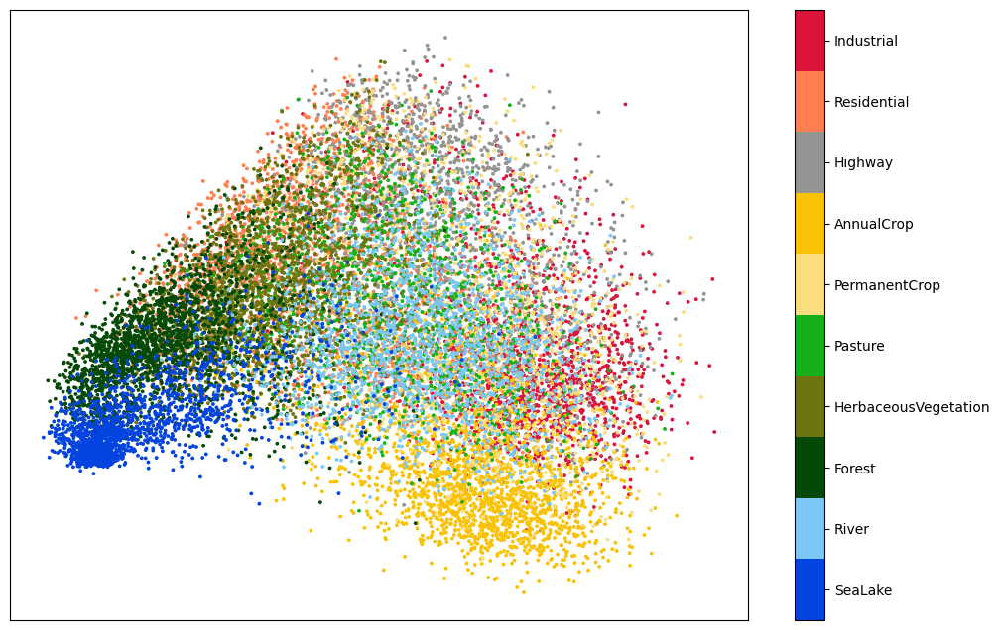

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 8))
plt.scatter(*train_effnet_fts_pca.T, s=3, c=(9-train_labels), cmap=cmap2.reversed())
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5, alpha=1.0)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(np.flip(class_names))

In [ ]:
umap = UMAP(
    n_components=2,
    n_neighbors=50,
    # min_dist=0.5,
    metric='euclidean',
    # n_epochs=2500,
)

train_effnet_fts_umap = umap.fit_transform(train_effnet_fts)

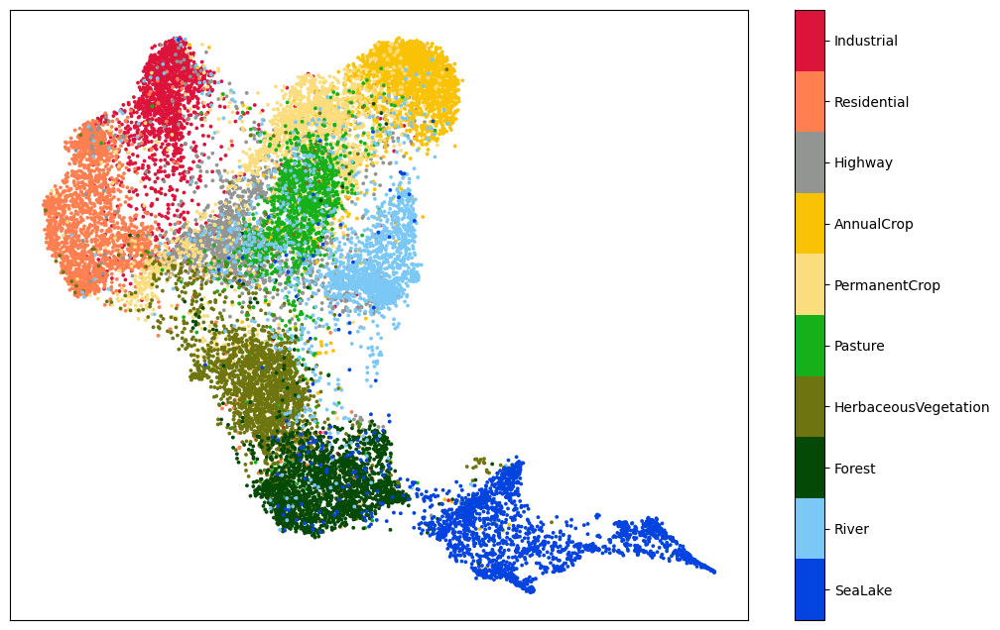

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 8))
plt.scatter(*train_effnet_fts_umap.T, s=3, c=(9-train_labels), cmap=cmap2.reversed())
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5, alpha=1.0)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(np.flip(class_names))

In [ ]:
pca = PCA(n_components=2)
train_effnet_encoded_fts_pca = pca.fit_transform(train_effnet_encoded_fts)

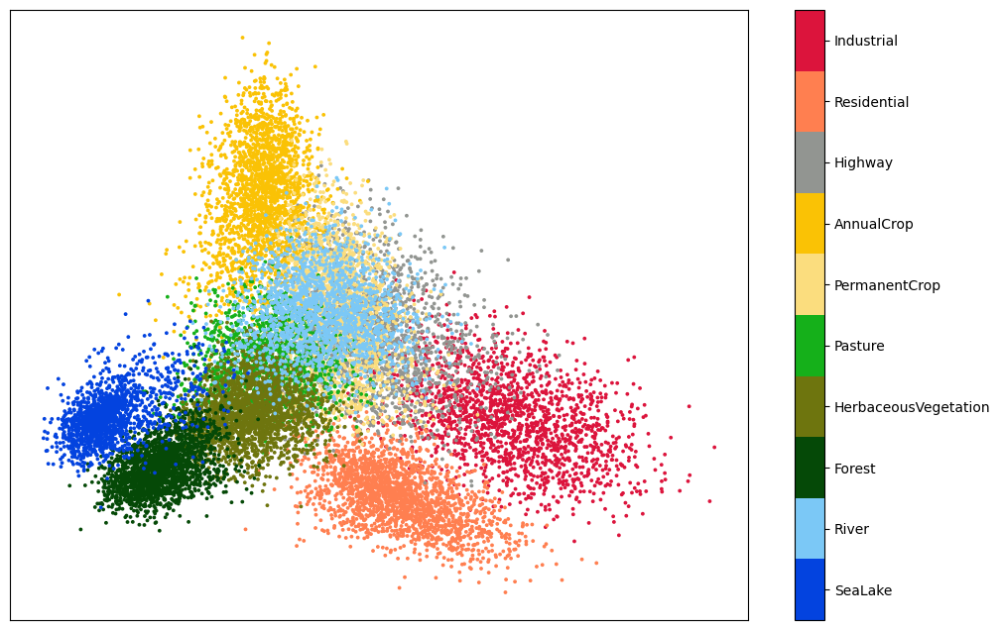

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 8))
plt.scatter(*train_effnet_encoded_fts_pca.T, s=3, c=(9-train_labels), cmap=cmap2.reversed())
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5, alpha=1.0)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(np.flip(class_names))

In [ ]:
umap = UMAP(
    n_components=2,
    n_neighbors=50,
    # min_dist=0.5,
    metric='euclidean',
    # n_epochs=2500,
)

train_effnet_encoded_fts_umap = umap.fit_transform(train_effnet_encoded_fts)

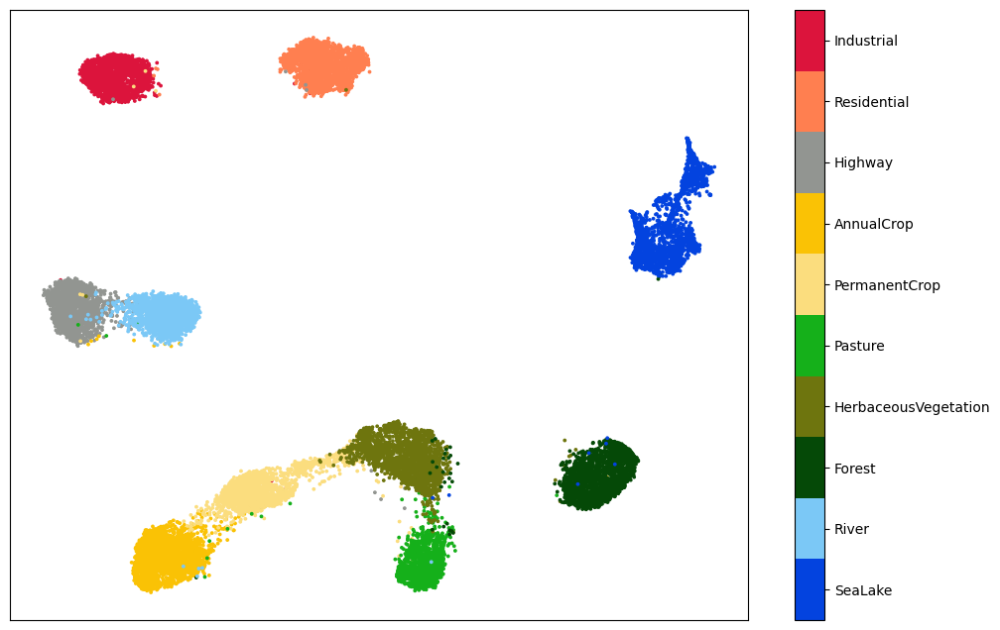

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 8))
plt.scatter(*train_effnet_encoded_fts_umap.T, s=3, c=(9-train_labels), cmap=cmap2.reversed())
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5, alpha=1.0)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(np.flip(class_names))

# Classifiers on Single Feature

At the early exploration of features, we run the logistic regression on single feature to compare their performance.

1.   LBP
2.   HOG
3. Color Features
4. GLCM
5. EfficientNet Features




## Logistic Regression on LBP

In [ ]:
# get LBP histogram from all training images
train_lbp_histograms = []

# Process each image
for img in train_imgs:
    # Convert to grayscale
    gray_img = rgb2gray(img)
    # Compute LBP histogram
    lbp_hist = get_lbp_histogram(gray_img)
    # Append the histogram to the list
    train_lbp_histograms.append(lbp_hist)

# Convert the list of histograms into a NumPy array
train_lbp_histograms = np.array(train_lbp_histograms)

# get LBP histogram from all validation images
val_lbp_histograms = []

# Process each image
for img in val_imgs:
    # Convert to grayscale
    gray_img = rgb2gray(img)
    # Compute LBP histogram
    lbp_hist = get_lbp_histogram(gray_img)
    # Append the histogram to the list
    val_lbp_histograms.append(lbp_hist)

# Convert the list of histograms into a NumPy array
val_lbp_histograms = np.array(val_lbp_histograms)
val_lbp_histograms.shape

(4050, 256)

In [ ]:
# define logistic regression model


# Initialize and train the logistic regression model
model = LogisticRegression(max_iter=2000, solver='lbfgs', multi_class='multinomial')
model.fit(train_lbp_histograms, train_labels)

LogisticRegression(max_iter=2000, multi_class='multinomial')

In [ ]:
# Predict on test data
predictions = model.predict(val_lbp_histograms)
#val_pred_labels = np.argmax(predictions, axis=1)
val_pred_labels = predictions

# Evaluate the model
accuracy = accuracy_score(val_labels, val_pred_labels)
conf_matrix = confusion_matrix(val_labels, val_pred_labels)
# You can also compute precision, recall, and F1-score as needed

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")

Accuracy: 0.5738271604938272
Confusion Matrix:
[[234  22  10  24  20   0  65   0   0   0]
 [  3 432   1   0   1   0  12   1   0   0]
 [ 27  28  29 166  29   0  44  13  38   1]
 [ 15   2   3 275   9   0  53  12  73   8]
 [ 39  21   5  99 102   0 102   2   5   0]
 [ 23  26   0  20   3   0 128  38  61   1]
 [ 12  84   0  13  36   0 287  14   4   0]
 [  0  24   0   2   0   0   4 415   2   3]
 [  3   6   1 160   5   1  29  26 132  12]
 [  0   0   0   2   0   0   0  21   9 418]]


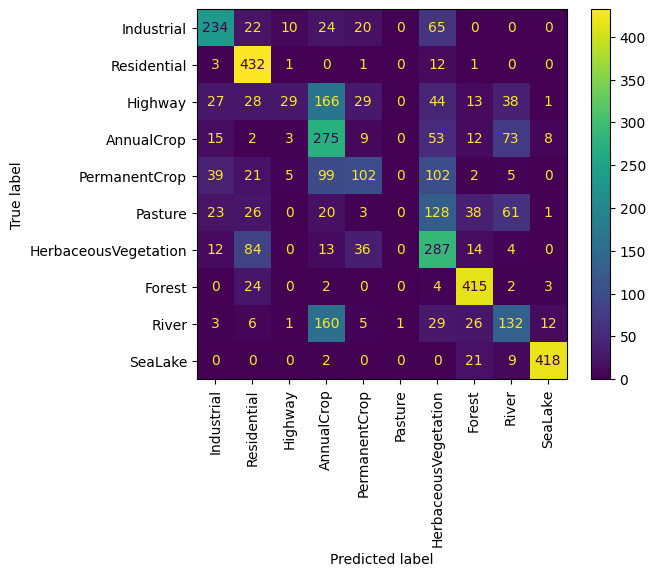

In [ ]:
ConfusionMatrixDisplay.from_predictions(
    val_labels,
    val_pred_labels,
    normalize=None,
    display_labels=class_names,
    xticks_rotation='vertical',
    # values_format='.2f',
)
plt.show()

##Logistic Regression on HOG

In [ ]:
# get HOG feature vector from all training images
train_hog_features = []
val_hog_features = []

# Process each image
for img in train_imgs:
    # Convert to grayscale
    gray_img = rgb2gray(img)
    # Compute LBP histogram
    fd, _ = get_hog_image(gray_img)
    # Append the histogram to the list
    train_hog_features.append(fd)

# Convert the list into a NumPy array
train_hog_features = np.array(train_hog_features)

# get HOG feature vectors from all validation images
# Process each image
for img in val_imgs:
    # Convert to grayscale
    gray_img = rgb2gray(img)
    # Compute LBP histogram
    fd, _ = get_hog_image(gray_img)
    # Append the histogram to the list
    val_hog_features.append(fd)

# Convert the list into a NumPy array
val_hog_features = np.array(val_hog_features)


In [ ]:
# standardize feature vectors for model training and prediction
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_hog_features_scaled = scaler.fit_transform(train_hog_features)
val_hog_features_scaled = scaler.fit_transform(val_hog_features)

In [ ]:
train_hog_features_scaled.shape

(18900, 1764)

In [ ]:
# Initialize and train the logistic regression model
hog_model = LogisticRegression(max_iter=2000, solver='lbfgs', multi_class='multinomial')
hog_model.fit(train_hog_features_scaled, train_labels)


LogisticRegression(max_iter=2000, multi_class='multinomial')

In [ ]:
# Predict on test data
predictions = hog_model.predict(val_hog_features_scaled)
#val_pred_labels = np.argmax(predictions, axis=1)
val_pred_labels = predictions

# Evaluate the model
accuracy = accuracy_score(val_labels, val_pred_labels)
conf_matrix = confusion_matrix(val_labels, val_pred_labels)
# You can also compute precision, recall, and F1-score as needed

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")

Accuracy: 0.542716049382716
Confusion Matrix:
[[191  30  12  20  51  28  36   2   5   0]
 [ 27 300   6   0  11   8  64  34   0   0]
 [ 23   1 190  41  39  11  15   0  55   0]
 [ 14   0  62 231  32  23   7   2  78   1]
 [ 36  22  43  45 112  29  61   4  22   1]
 [ 27  13  24  17  47  81  55   9  18   9]
 [ 27  93  19   7  53  51 151  36  11   2]
 [  3  39   0   0   1   9  34 353   0  11]
 [  9   0  59  66  24  30  11   0 171   5]
 [  1   0   1   1   1   6   0  18   4 418]]


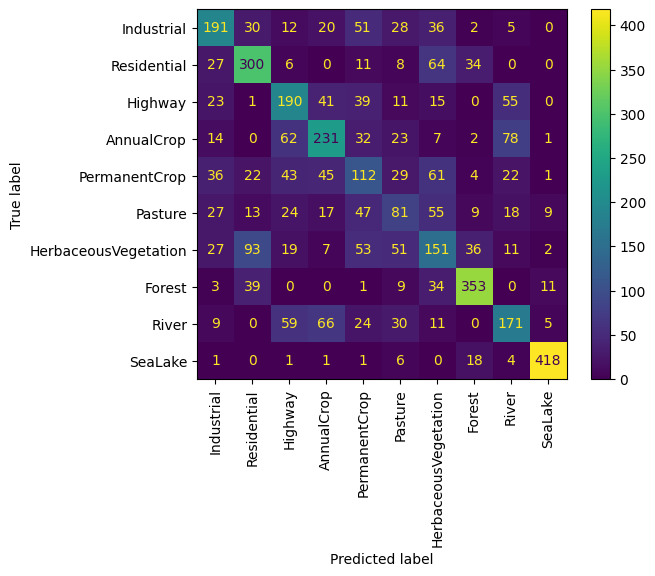

In [ ]:
ConfusionMatrixDisplay.from_predictions(
    val_labels,
    val_pred_labels,
    normalize=None,
    display_labels=class_names,
    xticks_rotation='vertical',
    # values_format='.2f',
)
plt.show()

such as Regression, k-nearest neighbors (KNN), or XGBoost

##Logistic Regression on Color Features

Validation Accuracy: 0.7066666666666667



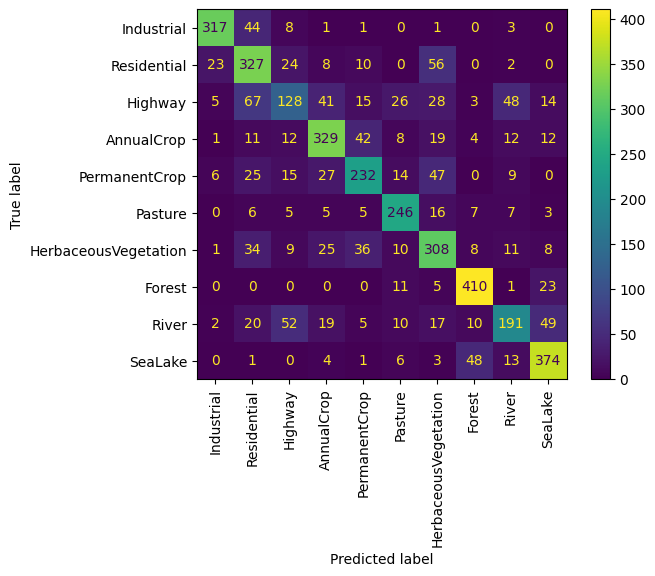

In [ ]:
## Average RGB channel pixel value feature vectors
train_avg_pixels_feat_vec = np.load(os.path.join(drive_path, 'data/train/train_avg_pixels_feat_vec.npy'))
val_avg_pixels_feat_vec = np.load(os.path.join(drive_path, 'data/val/val_avg_pixels_feat_vec.npy'))
test_avg_pixels_feat_vec = np.load(os.path.join(drive_path, 'data/test/test_avg_pixels_feat_vec.npy'))

## K-means color bin histogram feature vectors
train_kmeans_hists = np.load(os.path.join(drive_path, 'data/train/kmeans_color_freqs.npy'))
val_kmeans_hists = np.load(os.path.join(drive_path, 'data/val/kmeans_color_freqs.npy'))
test_kmeans_hists = np.load(os.path.join(drive_path, 'data/test/kmeans_color_freqs.npy'))

scaler_color = MinMaxScaler()

## Color set: Only the color feature vectors(avg RGB, kmeans color hists) combined
train_color = np.hstack((train_avg_pixels_feat_vec, train_kmeans_hists))
val_color = np.hstack((val_avg_pixels_feat_vec, val_kmeans_hists))
test_color = np.hstack((test_avg_pixels_feat_vec, test_kmeans_hists))

train_color = scaler_color.fit_transform(train_color)
val_color = scaler_color.transform(val_color)
test_color = scaler_color.transform(test_color)

# Initialize and train the logistic regression model
color_model = LogisticRegression(max_iter=2000, C=100, solver='lbfgs', multi_class='multinomial')
color_model.fit(train_color, train_labels)

# Predict on test data
predictions = color_model.predict(val_color)
#val_pred_labels = np.argmax(predictions, axis=1)
val_pred_labels = predictions

# Evaluate the model
accuracy = accuracy_score(val_labels, val_pred_labels)

print(f"Validation Accuracy: {accuracy}\n")

ConfusionMatrixDisplay.from_predictions(
    val_labels,
    val_pred_labels,
    normalize=None,
    display_labels=class_names,
    xticks_rotation='vertical',
    # values_format='.2f',
)
plt.show()

##Logistic Regression on GLCM

In [ ]:
glcm_dist = [1]
glcm_angl = [0, np.pi/4, np.pi/2, 3*np.pi/4, 4*np.pi/4, 5*np.pi/4, 6*np.pi/4, 7*np.pi/4]
n_levels = 128

# exclude entropy to reduce computing time
def get_glcm_features(image) :
  # Scale the grayscale image to the range [0, 255] and convert to uint8
  gray_image_scaled = (image * (n_levels-1)).astype(np.uint8)
  # Compute GLCM
  glcm = graycomatrix(gray_image_scaled, distances=glcm_dist, angles=glcm_angl,
                    levels=n_levels, symmetric=True, normed=True)

  # Compute GLCM properties
  contrast = graycoprops(glcm, 'contrast')
  dissimilarity = graycoprops(glcm, 'dissimilarity')
  homogeneity = graycoprops(glcm, 'homogeneity')
  energy = graycoprops(glcm, 'energy')
  correlation = graycoprops(glcm, 'correlation')
  #entropy = -np.sum(glcm * np.log(glcm + np.finfo(float).eps), axis=(2,3))
  entropy = np.zeros((n_levels,n_levels))

  return contrast, dissimilarity, homogeneity, energy, correlation, entropy

In [ ]:
# get GLCM feature vector from all training images
train_glcm_features = []
val_glcm_features = []

# Process each image
for img in train_imgs:
    # Convert to grayscale
    gray_img = rgb2gray(img)
    # get glcm features
    contrast, dissimilarity, homogeneity, energy, correlation, _ = get_glcm_features(gray_img)
    # flatten features, exclude entropy
    feature_vector = np.hstack([f.flatten() for f in [contrast, dissimilarity, homogeneity, energy, correlation]])
    train_glcm_features.append(feature_vector)
# Convert the list into a NumPy array
train_glcm_features = np.array(train_glcm_features)

# get GLCM feature vectors from all validation images
# Process each image
for img in val_imgs:
    # Convert to grayscale
    gray_img = rgb2gray(img)
    # get glcm features
    contrast, dissimilarity, homogeneity, energy, correlation, _ = get_glcm_features(gray_img)
    # flatten features, exclude entropy
    feature_vector = np.hstack([f.flatten() for f in [contrast, dissimilarity, homogeneity, energy, correlation]])
    val_glcm_features.append(feature_vector)
# Convert the list into a NumPy array
val_glcm_features = np.array(val_glcm_features)

val_glcm_features.shape

(4050, 40)

In [ ]:
# standardize feature vectors for model training and prediction
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_glcm_features_scaled = scaler.fit_transform(train_glcm_features)
val_glcm_features_scaled = scaler.fit_transform(val_glcm_features)



In [ ]:
# Initialize and train the logistic regression model
glcm_model = LogisticRegression(max_iter=2000, solver='lbfgs', multi_class='multinomial')
glcm_model.fit(train_glcm_features_scaled, train_labels)


LogisticRegression(max_iter=2000, multi_class='multinomial')

In [ ]:
# Predict on test data
predictions = glcm_model.predict(val_glcm_features_scaled)
#val_pred_labels = np.argmax(predictions, axis=1)
val_pred_labels = predictions

# Evaluate the model
accuracy = accuracy_score(val_labels, val_pred_labels)
conf_matrix = confusion_matrix(val_labels, val_pred_labels)
# You can also compute precision, recall, and F1-score as needed

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")


Accuracy: 0.7209876543209877
Confusion Matrix:
[[324  16  12   5   9   0   9   0   0   0]
 [  7 425   1   0   5   0  12   0   0   0]
 [ 16  14 124  38  62  22  60   5  34   0]
 [  0   1  16 346  23  22  15   1  22   4]
 [ 18   7  28  13 224  14  68   0   3   0]
 [  0   0   7  29  16 183  27  10  21   7]
 [ 17  21   7  19  46  42 282  16   0   0]
 [  0   1   0   0   0  12   7 422   0   8]
 [  4   0  42  85  15  43  23   1 159   3]
 [  0   0   0   8   0   0   0   1  10 431]]


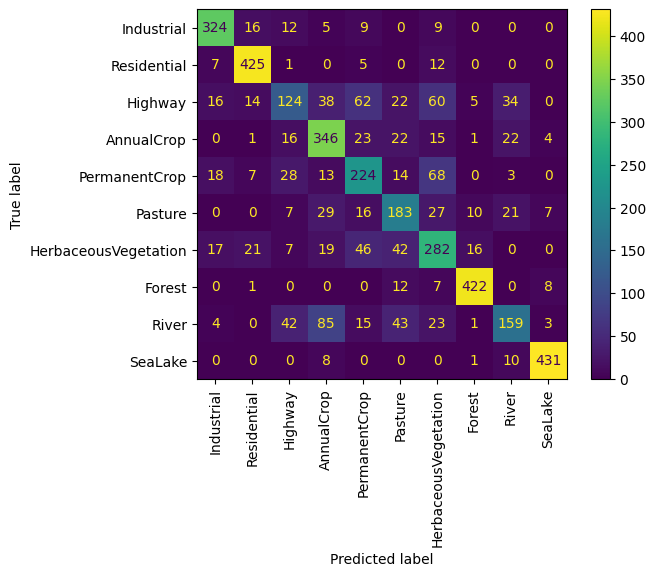

In [ ]:
ConfusionMatrixDisplay.from_predictions(
    val_labels,
    val_pred_labels,
    normalize=None,
    display_labels=class_names,
    xticks_rotation='vertical',
    # values_format='.2f',
)
plt.show()

## Logistic Regression on Compressed EfficientNet features

In [ ]:
train_effnet_encoded_fts = np.load(os.path.join(drive_path, 'data/train/effnet_encoded_fts.npy'))
val_effnet_encoded_fts = np.load(os.path.join(drive_path, 'data/val/effnet_encoded_fts.npy'))
test_effnet_encoded_fts = np.load(os.path.join(drive_path, 'data/test/effnet_encoded_fts.npy'))


In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(
    penalty='l2',
    C=100.,
    solver='lbfgs',
    max_iter=2000,
    multi_class='multinomial',
)

logreg.fit(X=train_effnet_encoded_fts, y=train_labels)

print(f'train acc: {logreg.score(X=train_effnet_encoded_fts, y=train_labels):.3f}')
print(f'val acc: {logreg.score(X=val_effnet_encoded_fts, y=val_labels):.3f}')


train acc: 0.998
val acc: 0.927


# Final Classifiers

We choose two classifiers for final prediction.

1.   Logistic Regression
2.   XGBoost

For the combined feature vector, we keep two datasets
1. Basic feature vector that contains three simple feature vectors
2. Full feature vector that contains three simple feature vectors and one complex feature vector.

Then we run both models on the two combined feature vectors, and compare their performance on accuracy and efficiency.



## Combining Feature Vectors

In [14]:
## Average RGB channel pixel value feature vectors
train_avg_pixels_feat_vec = np.load(os.path.join(drive_path, 'data/train/train_avg_pixels_feat_vec.npy'))
val_avg_pixels_feat_vec = np.load(os.path.join(drive_path, 'data/val/val_avg_pixels_feat_vec.npy'))
test_avg_pixels_feat_vec = np.load(os.path.join(drive_path, 'data/test/test_avg_pixels_feat_vec.npy'))
print(f'Avg pixels: {train_avg_pixels_feat_vec.shape}')

## K-means color bin histogram feature vectors
train_kmeans_hists = np.load(os.path.join(drive_path, 'data/train/kmeans_color_freqs.npy'))
val_kmeans_hists = np.load(os.path.join(drive_path, 'data/val/kmeans_color_freqs.npy'))
test_kmeans_hists = np.load(os.path.join(drive_path, 'data/test/kmeans_color_freqs.npy'))
print(f'K-means color bin histograms: {train_kmeans_hists.shape}')

## GLCM feature vectors
train_glcm_fts = np.load(os.path.join(drive_path, 'data/train/glcm_fts.npy'))
val_glcm_fts = np.load(os.path.join(drive_path, 'data/val/glcm_fts.npy'))
test_glcm_fts = np.load(os.path.join(drive_path, 'data/test/glcm_fts.npy'))
print(f'GLCM properties: {train_glcm_fts.shape}')

## EfficientNet feature vectors
train_effnet_encoded_fts = np.load(os.path.join(drive_path, 'data/train/effnet_encoded_fts.npy'))
val_effnet_encoded_fts = np.load(os.path.join(drive_path, 'data/val/effnet_encoded_fts.npy'))
test_effnet_encoded_fts = np.load(os.path.join(drive_path, 'data/test/effnet_encoded_fts.npy'))
print(f'Compressed EfficientNet features: {train_effnet_encoded_fts.shape}')


Avg pixels: (18900, 3)
K-means color bin histograms: (18900, 64)
GLCM properties: (18900, 20)
Compressed EfficientNet features: (18900, 64)


In [16]:
## Using MinMax scaling since many of the features in the EfficientNet set are heavily right skewed
scaler_basic, scaler_full = MinMaxScaler(), MinMaxScaler()

## Basic set: Only the basic feature vectors(avg RGB, kmeans color hists, & GLCM) combined
input_train_basic = np.hstack((train_avg_pixels_feat_vec, train_kmeans_hists, train_glcm_fts))
input_val_basic = np.hstack((val_avg_pixels_feat_vec, val_kmeans_hists, val_glcm_fts))
input_test_basic = np.hstack((test_avg_pixels_feat_vec, test_kmeans_hists, test_glcm_fts))

input_train_basic = scaler_basic.fit_transform(input_train_basic)
input_val_basic = scaler_basic.transform(input_val_basic)
input_test_basic = scaler_basic.transform(input_test_basic)

print(f'Basic feature count: {input_train_basic.shape[1]}')

## Full set: Adding complex feature vector(EffNet)
input_train_full = np.hstack((input_train_basic, train_effnet_encoded_fts))
input_val_full = np.hstack((input_val_basic, val_effnet_encoded_fts))
input_test_full = np.hstack((input_test_basic, test_effnet_encoded_fts))

input_train_full = scaler_full.fit_transform(input_train_full)
input_val_full = scaler_full.transform(input_val_full)
input_test_full = scaler_full.transform(input_test_full)

print(f'Full feature count: {input_train_full.shape[1]}')


Basic feature count: 87
Full feature count: 151


## PCA Analysis of Final Features

In [17]:
input_train_full = np.hstack(
    (
        train_avg_pixels_feat_vec,
        train_kmeans_hists,
        train_glcm_fts,
        train_effnet_encoded_fts,
     )
)

std_scaler = StandardScaler()

input_train_full_stdsc = std_scaler.fit_transform(input_train_full)

In [18]:
pca = PCA(whiten=False)

input_train_full_pca = pca.fit_transform(input_train_full_stdsc)

exp_var_pca = pca.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

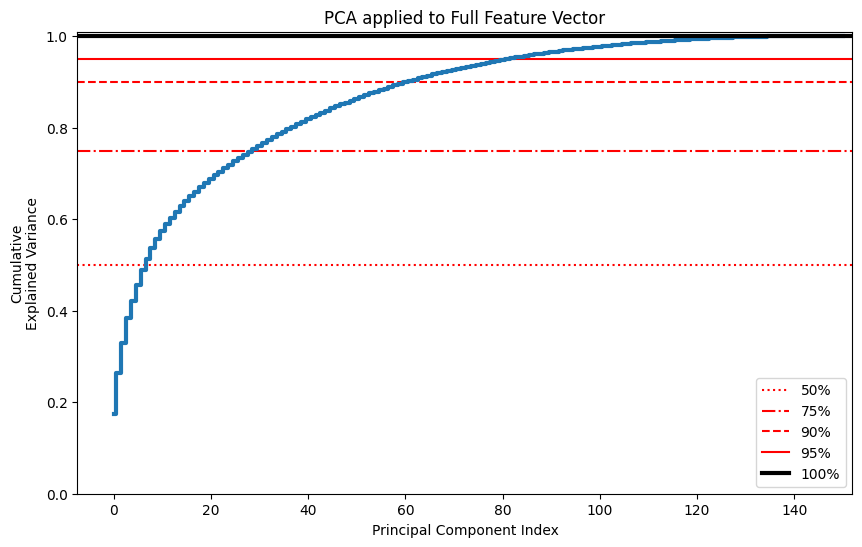

In [20]:
plt.figure(figsize=(10,6))
var_thresholds = [0.5, 0.75, 0.9, 0.95]
linestyles = [':', '-.', '--', '-']

for i in range(len(var_thresholds)):
    plt.axhline(
        var_thresholds[i],
        color='red',
        linestyle=linestyles[i],
        linewidth=1.5,
        label=f'{var_thresholds[i]:.0%}'
    )

plt.step(
    range(0,len(cum_sum_eigenvalues)),
    cum_sum_eigenvalues,
    where='mid',
    linewidth=3,
)

plt.axhline(
    1.,
    color='black',
    linestyle='-',
    linewidth=3,
    label='100%'
)

plt.title('PCA applied to Full Feature Vector')
plt.xlabel('Principal Component Index')
plt.xlim(right=152)
plt.ylabel('Cumulative\nExplained Variance')
plt.ylim([0., 1.01])
plt.legend(loc='lower right')
plt.show()

## 1.1 Logistic Regression on Basic Feature Vectors

In [ ]:
def run_logreg_hparam_search(param_grid):
    results = {}
    for i, config in enumerate(param_grid):
        results_row = dict(config)
        logreg = LogisticRegression(
            penalty='l2',
            solver='lbfgs',
            multi_class='multinomial',
            **config
        )
        print(config, end=', ')

        start_time = time.perf_counter()
        logreg.fit(input_train_basic, train_labels)
        training_time = time.perf_counter() - start_time
        print(f'{training_time:.1f} s', end=', ')

        train_acc = logreg.score(input_train_basic, train_labels)
        val_acc = logreg.score(input_val_basic, val_labels)
        print(f'train acc: {train_acc:.1%}', end=', ')
        print(f'val acc: {val_acc:.1%}')
        results_row.update({
            'training_time_sec': training_time,
            'train_acc':         train_acc,
            'val_acc':           val_acc,
        })
        results.update({i: results_row})

    return pd.DataFrame(results).T

In [ ]:
logreg_param_grid = ParameterGrid(
    {
    'max_iter' : [100, 250, 500, 1000, 3000],
     "C": [0.01, 0.1, 1, 10, 100, 1000, 10000]
    }
)

logreg_1_1_df = run_logreg_hparam_search(logreg_param_grid)

{'C': 0.01, 'max_iter': 100}, 1.6 s, train acc: 73.9%, val acc: 73.8%
{'C': 0.01, 'max_iter': 250}, 1.6 s, train acc: 73.9%, val acc: 73.8%
{'C': 0.01, 'max_iter': 500}, 2.2 s, train acc: 73.9%, val acc: 73.8%
{'C': 0.01, 'max_iter': 1000}, 4.5 s, train acc: 73.9%, val acc: 73.8%
{'C': 0.01, 'max_iter': 3000}, 4.0 s, train acc: 73.9%, val acc: 73.8%
{'C': 0.1, 'max_iter': 100}, 1.9 s, train acc: 79.5%, val acc: 79.1%
{'C': 0.1, 'max_iter': 250}, 3.3 s, train acc: 79.5%, val acc: 79.1%
{'C': 0.1, 'max_iter': 500}, 5.2 s, train acc: 79.5%, val acc: 79.1%
{'C': 0.1, 'max_iter': 1000}, 5.0 s, train acc: 79.5%, val acc: 79.1%
{'C': 0.1, 'max_iter': 3000}, 3.4 s, train acc: 79.5%, val acc: 79.1%
{'C': 1, 'max_iter': 100}, 2.0 s, train acc: 83.4%, val acc: 82.5%
{'C': 1, 'max_iter': 250}, 6.4 s, train acc: 83.4%, val acc: 82.7%
{'C': 1, 'max_iter': 500}, 8.7 s, train acc: 83.4%, val acc: 82.6%
{'C': 1, 'max_iter': 1000}, 8.6 s, train acc: 83.4%, val acc: 82.6%
{'C': 1, 'max_iter': 3000}, 8.9 

In [ ]:
logreg_1_1_df.sort_values(by="val_acc", ascending=False).head()

,C,max_iter,training_time_sec,train_acc,val_acc
34,10000.0,3000.0,70.263720,0.873333,0.857037
29,1000.0,3000.0,70.059082,0.871905,0.855802
33,10000.0,1000.0,23.771302,0.869735,0.853580
28,1000.0,1000.0,22.091975,0.868148,0.853086
23,100.0,1000.0,22.115800,0.865503,0.850617


In [ ]:
def Logistic_Regression_Model(input_train, input_val, input_test, train_labels=train_labels, val_labels=val_labels, val_df=val_df, max_iter=3000, C=10000):
    logreg = LogisticRegression(
        penalty='l2',
        C=C,
        solver='lbfgs',
        max_iter=max_iter,
        multi_class='multinomial',
    )

    logreg.fit(X=input_train, y=train_labels)

    print(f'train acc: {logreg.score(X=input_train, y=train_labels):.3f}')
    print(f'val acc: {logreg.score(X=input_val, y=val_labels):.3f}')

    val_acc = logreg.score(X=input_val, y=val_labels)

    predictions = logreg.predict(input_val)

    target_names=val_df[["class_name", "class_id"]].drop_duplicates()["class_name"].values
    print(classification_report(val_labels, predictions, target_names=target_names))
    cm = tf.math.confusion_matrix(val_labels, predictions)
    cm = cm/cm.numpy().sum(axis=1)[:, tf.newaxis]

    plt.figure(figsize=(10,4))
    sns.heatmap(
        cm, annot=True,
        xticklabels=target_names,
        yticklabels=target_names)
    plt.xlabel("Predicted")
    plt.ylabel("True")

    print(f'test acc: {logreg.score(X=input_test, y=test_labels):.3f}')
    # return logreg



## 1.2 XGBoost on Basic Feature Vectors

 **Yes, it's perfectly fine to use `neg_log_loss` as the scoring parameter in GridSearchCV, even if you have `mlogloss` as the `eval_metric` in the `param_grid`.** Here's why:

**Purpose of Scoring Parameter:**

- The `scoring` parameter in GridSearchCV determines which metric is used to evaluate model performance during grid search. It's used to identify the best model among the different hyperparameter combinations.

**Purpose of eval_metric:**

- The `eval_metric` parameter, on the other hand, is specifically for XGBoost's internal evaluation during training. It's used to monitor model performance on the validation set during each round of boosting and guide early stopping.

**Compatibility of neg_log_loss and mlogloss:**

- `neg_log_loss` and `mlogloss` are essentially the same metric, but with opposite signs. `mlogloss` is the multiclass logloss, while `neg_log_loss` is its negative counterpart. Minimizing one is equivalent to minimizing the other.

**Advantages of using neg_log_loss:**

- **Consistency:** Using `neg_log_loss` for both GridSearchCV's `scoring` and XGBoost's `eval_metric` ensures consistency in evaluation.
- **Availability:** `neg_log_loss` is often more readily available in scikit-learn and other libraries, making it a more convenient choice.

**Key Points:**

- Both metrics measure the same underlying concept: multiclass logarithmic loss.
- Using `neg_log_loss` for both ensures alignment in model selection and training.
- If you have scikit-learn installed, you can use `mlogloss` as well, but `neg_log_loss` offers consistency and convenience.

Therefore, you can confidently use `neg_log_loss` as the scoring parameter in GridSearchCV without any issues, even with `mlogloss` as the `eval_metric` in the `param_grid`.

In [ ]:
def run_xgb_hparam_search1_2(param_grid):
    results = {}
    for i, config in enumerate(param_grid):
        results_row = dict(config)
        xgb_model = xgb.XGBClassifier(
            **config
        )
        print(config, end=', ')

        start_time = time.perf_counter()
        xgb_model.fit(input_train_basic, train_labels, eval_set=[(input_val_basic, val_labels)], verbose=False)
        training_time = time.perf_counter() - start_time
        print(f'{training_time:.1f} s', end=', ')

        train_acc = xgb_model.score(input_train_basic, train_labels)
        val_acc = xgb_model.score(input_val_basic, val_labels)
        print(f'train acc: {train_acc:.1%}', end=', ')
        print(f'val acc: {val_acc:.1%}')
        results_row.update({
            'training_time_sec': training_time,
            'train_acc':         train_acc,
            'val_acc':           val_acc,
        })
        results.update({i: results_row})

    return pd.DataFrame(results).T

xgb_param_grid = ParameterGrid(
      {
          "objective": ["multi:softmax"],
          "eval_metric": ["mlogloss"],
          "early_stopping_rounds": [10],
          "n_estimators": [50, 100, 200],
          "max_depth": [3, 5, 7],
          "learning_rate": [0.01, 0.1, 0.3],
      }
)

xgb_1_2_df = run_xgb_hparam_search1_2(xgb_param_grid)


{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'objective': 'multi:softmax'}, 4.9 s, train acc: 79.5%, val acc: 77.8%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'objective': 'multi:softmax'}, 9.6 s, train acc: 81.3%, val acc: 79.5%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'objective': 'multi:softmax'}, 27.7 s, train acc: 83.8%, val acc: 81.7%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'objective': 'multi:softmax'}, 7.2 s, train acc: 86.8%, val acc: 83.0%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'objective': 'multi:softmax'}, 21.9 s, train acc: 88.3%, val acc: 84.3%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'le

In [ ]:
xgb_1_2_df.sort_values(by="val_acc", ascending=False).head()

,early_stopping_rounds,eval_metric,learning_rate,max_depth,n_estimators,objective,training_time_sec,train_acc,val_acc
17,10,mlogloss,0.1,7,200,multi:softmax,51.511199,1.0,0.927901
26,10,mlogloss,0.3,7,200,multi:softmax,19.019848,1.0,0.924938
25,10,mlogloss,0.3,7,100,multi:softmax,22.662702,1.0,0.924938
23,10,mlogloss,0.3,5,200,multi:softmax,17.99966,0.999894,0.921235
22,10,mlogloss,0.3,5,100,multi:softmax,15.234058,0.99963,0.920247


In [ ]:
xgb_1_2 = xgb.XGBClassifier(
    objective = "multi:softmax",
    eval_metric = "mlogloss",
    early_stopping_rounds = 10,
    n_estimators = 200,
    max_depth = 7,
    learning_rate = 0.1,
)

xgb_1_2.fit(input_train_basic, train_labels, eval_set=[(input_val_basic, val_labels)], verbose=False)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=10,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=7,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, objective='multi:softmax', ...)

Test Accuracy: 0.9323
                      precision    recall  f1-score   support

          Industrial       0.94      0.93      0.94       375
         Residential       0.97      0.97      0.97       450
             Highway       0.83      0.83      0.83       375
          AnnualCrop       0.95      0.94      0.95       450
       PermanentCrop       0.93      0.90      0.91       375
             Pasture       0.90      0.93      0.91       300
HerbaceousVegetation       0.94      0.94      0.94       450
              Forest       0.97      0.98      0.97       450
               River       0.88      0.89      0.89       375
             SeaLake       0.99      0.98      0.98       450

            accuracy                           0.93      4050
           macro avg       0.93      0.93      0.93      4050
        weighted avg       0.93      0.93      0.93      4050



/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [01:22:40] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
  warnings.warn(smsg, UserWarning)


Text(95.7222222222222, 0.5, 'True')

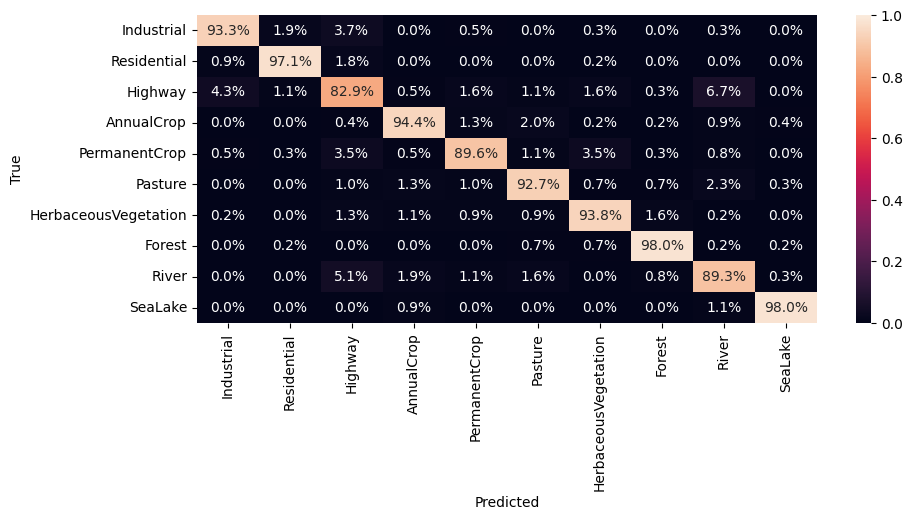

In [ ]:
# Make predictions on test set
dtest1_2 = xgb.DMatrix(input_test_basic)
test_pred1_2 = xgb_1_2.predict(input_test_basic)

# Evaluate model on test set
accuracy1_2 = (test_pred1_2 == test_labels).mean()
print(f"Test Accuracy: {accuracy1_2:.4f}")

# Save the best model
xgb_1_2.save_model(os.path.join(drive_path, 'models/best_1_2_XGBoost.xgb'))

target_names=test_df[["class_name", "class_id"]].drop_duplicates()["class_name"].values
print(classification_report(test_labels, test_pred1_2, target_names=target_names))
cm1_2 = tf.math.confusion_matrix(test_labels, test_pred1_2)
cm1_2 = cm1_2/cm1_2.numpy().sum(axis=1)[:, tf.newaxis]

plt.figure(figsize=(10,4))
sns.heatmap(
    cm1_2, annot=True, fmt='.1%',
    vmin=0., vmax=1.,
    xticklabels=target_names,
    yticklabels=target_names)
plt.xlabel("Predicted")
plt.ylabel("True")


In [ ]:
def XGBoost_single_model():
    # Define XGBoost model parameters
    params = {
        "objective": "multi:softprob",  # For multi-class classification with 10 classes
        "num_class": 10,  # Number of classes
        "eval_metric": "mlogloss",  # Evaluation metric for multi-class classification
        "n_estimators": 100,
        "max_depth": 5,
        "learning_rate": 0.1,
        "early_stopping_rounds": 10,  # Stop training if validation loss doesn't improve for n rounds
    }

    # Create DMatrix for training and validation
    dtrain = xgb.DMatrix(input_train_basic, label=train_labels)
    dval = xgb.DMatrix(input_val_basic, label=val_labels)

    # Train XGBoost model
    bst = xgb.train(params, dtrain, evals=[(dval, "val")])

    # Evaluate model on validation set
    # mlogloss = -bst.best_score
    # print(f"Validation mLogLoss: {mlogloss:.4f}")

    # Make predictions on test set
    dtest = xgb.DMatrix(input_test_basic)
    test_pred = bst.predict(dtest)
    test_pred = test_pred.argmax(axis=1)

    # Evaluate model on test set (replace with your desired metrics)
    accuracy = (test_pred == test_labels).mean()
    print(f"Test Accuracy: {accuracy:.4f}")

    # # Save the model
    # bst.save_model("model.xgb")

    # # Load the model
    # bst = xgb.Booster()
    # bst.load_model("model.xgb")

    target_names=test_df[["class_name", "class_id"]].drop_duplicates()["class_name"].values

    # print(classification_report(test_labels, test_pred, target_names=target_names))

    cm = tf.math.confusion_matrix(test_labels, test_pred)
    cm = cm/cm.numpy().sum(axis=1)[:, tf.newaxis]

    plt.figure(figsize=(10,4))
    sns.heatmap(
        cm, annot=True,
        xticklabels=target_names,
        yticklabels=target_names)
    plt.xlabel("Predicted")
    plt.ylabel("True")

# XGBoost_single_model()

## 2.1 Logistic Regression on Basic + Advanced Feature Vectors combo

In [ ]:
def run_logreg_hparam_search2_1(param_grid):
    results = {}
    for i, config in enumerate(param_grid):
        results_row = dict(config)
        logreg = LogisticRegression(
            penalty='l2',
            solver='lbfgs',
            multi_class='multinomial',
            **config
        )
        print(config, end=', ')

        start_time = time.perf_counter()
        logreg.fit(input_train_full, train_labels)
        training_time = time.perf_counter() - start_time
        print(f'{training_time:.1f} s', end=', ')

        train_acc = logreg.score(input_train_full, train_labels)
        val_acc = logreg.score(input_val_full, val_labels)
        print(f'train acc: {train_acc:.1%}', end=', ')
        print(f'val acc: {val_acc:.1%}')
        results_row.update({
            'training_time_sec': training_time,
            'train_acc':         train_acc,
            'val_acc':           val_acc,
        })
        results.update({i: results_row})

    return pd.DataFrame(results).T

logreg_param_grid = ParameterGrid(
    {
    'max_iter' : [100, 250, 500, 1000, 3000],
     "C": [0.01, 0.1, 1, 10, 100, 1000, 10000]
    }
)

logreg_2_1_df = run_logreg_hparam_search2_1(logreg_param_grid)


{'C': 0.01, 'max_iter': 100}, 1.6 s, train acc: 98.2%, val acc: 94.6%
{'C': 0.01, 'max_iter': 250}, 1.6 s, train acc: 98.2%, val acc: 94.6%
{'C': 0.01, 'max_iter': 500}, 2.3 s, train acc: 98.2%, val acc: 94.6%
{'C': 0.01, 'max_iter': 1000}, 2.9 s, train acc: 98.2%, val acc: 94.6%
{'C': 0.01, 'max_iter': 3000}, 2.7 s, train acc: 98.2%, val acc: 94.6%
{'C': 0.1, 'max_iter': 100}, 3.9 s, train acc: 98.8%, val acc: 95.0%
{'C': 0.1, 'max_iter': 250}, 2.9 s, train acc: 98.8%, val acc: 95.0%
{'C': 0.1, 'max_iter': 500}, 2.8 s, train acc: 98.8%, val acc: 95.0%
{'C': 0.1, 'max_iter': 1000}, 5.5 s, train acc: 98.8%, val acc: 95.0%
{'C': 0.1, 'max_iter': 3000}, 4.9 s, train acc: 98.8%, val acc: 95.0%
{'C': 1, 'max_iter': 100}, 4.4 s, train acc: 99.2%, val acc: 95.2%
{'C': 1, 'max_iter': 250}, 8.4 s, train acc: 99.2%, val acc: 95.2%
{'C': 1, 'max_iter': 500}, 6.1 s, train acc: 99.2%, val acc: 95.2%
{'C': 1, 'max_iter': 1000}, 6.4 s, train acc: 99.2%, val acc: 95.2%
{'C': 1, 'max_iter': 3000}, 8.0 

In [ ]:
logreg_2_1_df.sort_values(by="val_acc", ascending=False).head()


,C,max_iter,training_time_sec,train_acc,val_acc
10,1.0,100.0,4.356531,0.992434,0.952099
11,1.0,250.0,8.383347,0.992434,0.951852
14,1.0,3000.0,7.970128,0.992434,0.951852
13,1.0,1000.0,6.409564,0.992434,0.951852
12,1.0,500.0,6.052397,0.992434,0.951852


In [ ]:
logreg_2_1 = LogisticRegression(
    penalty='l2',
    solver='lbfgs',
    multi_class='multinomial',
    C = 1,
    max_iter=100,
)

logreg_2_1.fit(input_train_full, train_labels)

LogisticRegression(C=1, multi_class='multinomial')

Test Accuracy: 0.9536
                      precision    recall  f1-score   support

          Industrial       0.97      0.97      0.97       375
         Residential       0.98      0.98      0.98       450
             Highway       0.91      0.93      0.92       375
          AnnualCrop       0.94      0.96      0.95       450
       PermanentCrop       0.94      0.90      0.92       375
             Pasture       0.95      0.94      0.94       300
HerbaceousVegetation       0.94      0.94      0.94       450
              Forest       0.96      0.99      0.98       450
               River       0.93      0.92      0.93       375
             SeaLake       0.99      0.99      0.99       450

            accuracy                           0.95      4050
           macro avg       0.95      0.95      0.95      4050
        weighted avg       0.95      0.95      0.95      4050



Text(95.7222222222222, 0.5, 'True')

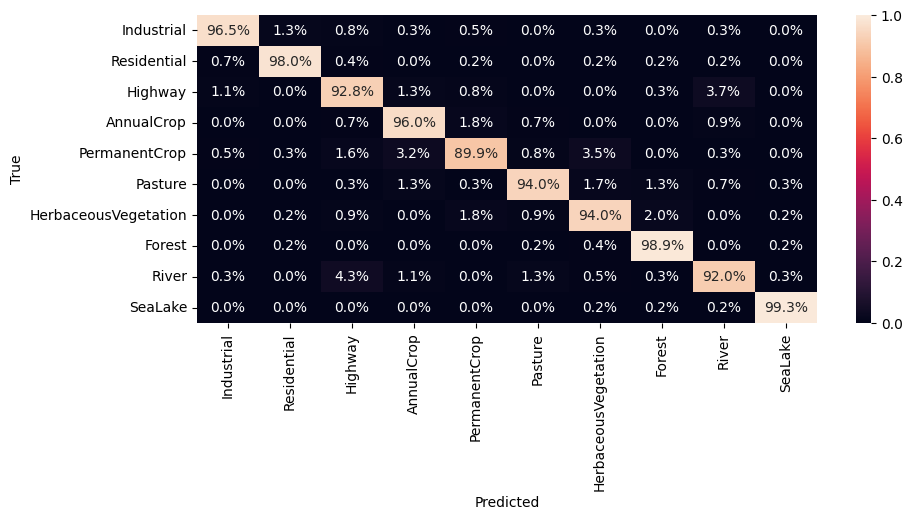

In [ ]:
# Make predictions on test set
test_pred2_1 = logreg_2_1.predict(input_test_full)

# Evaluate model on test set
accuracy2_1 = logreg_2_1.score(input_test_full, test_labels)
print(f"Test Accuracy: {accuracy2_1:.4f}")

target_names=test_df[["class_name", "class_id"]].drop_duplicates()["class_name"].values
print(classification_report(test_labels, test_pred2_1, target_names=target_names))
cm2_1 = tf.math.confusion_matrix(test_labels, test_pred2_1)
cm2_1 = cm2_1/cm2_1.numpy().sum(axis=1)[:, tf.newaxis]

plt.figure(figsize=(10,4))
sns.heatmap(
    cm2_1, annot=True, fmt='.1%',
    vmin=0., vmax=1.,
    xticklabels=target_names,
    yticklabels=target_names)
plt.xlabel("Predicted")
plt.ylabel("True")


## 2.2 XGBoost on Basic + Advanced Feature Vectors combo

In [ ]:
def run_xgb_hparam_search2_2(param_grid):
    results = {}
    for i, config in enumerate(param_grid):
        results_row = dict(config)
        xgb_model = xgb.XGBClassifier(
            **config
        )
        print(config, end=', ')

        start_time = time.perf_counter()
        xgb_model.fit(input_train_full, train_labels, eval_set=[(input_val_full, val_labels)], verbose=False)
        training_time = time.perf_counter() - start_time
        print(f'{training_time:.1f} s', end=', ')

        train_acc = xgb_model.score(input_train_full, train_labels)
        val_acc = xgb_model.score(input_val_full, val_labels)
        print(f'train acc: {train_acc:.1%}', end=', ')
        print(f'val acc: {val_acc:.1%}')
        results_row.update({
            'training_time_sec': training_time,
            'train_acc':         train_acc,
            'val_acc':           val_acc,
        })
        results.update({i: results_row})

    return pd.DataFrame(results).T

xgb_param_grid = ParameterGrid(
      {
          "objective": ["multi:softmax"],
          "eval_metric": ["mlogloss"],
          "early_stopping_rounds": [10],
          "n_estimators": [50, 100, 200],
          "max_depth": [3, 5, 7],
          "learning_rate": [0.01, 0.1, 0.3],
      }
)

xgb_2_2_df = run_xgb_hparam_search2_2(xgb_param_grid)


{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'objective': 'multi:softmax'}, 10.9 s, train acc: 94.4%, val acc: 91.0%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'objective': 'multi:softmax'}, 17.8 s, train acc: 95.8%, val acc: 92.4%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'objective': 'multi:softmax'}, 44.2 s, train acc: 97.2%, val acc: 93.4%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'objective': 'multi:softmax'}, 18.3 s, train acc: 97.4%, val acc: 92.1%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'objective': 'multi:softmax'}, 40.2 s, train acc: 97.9%, val acc: 92.6%
{'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 

In [ ]:
xgb_2_2_df.sort_values(by="val_acc", ascending=False).head()

,early_stopping_rounds,eval_metric,learning_rate,max_depth,n_estimators,objective,training_time_sec,train_acc,val_acc
10,10,mlogloss,0.1,3,100,multi:softmax,18.916368,0.996561,0.946914
11,10,mlogloss,0.1,3,200,multi:softmax,23.298027,0.996561,0.946914
20,10,mlogloss,0.3,3,200,multi:softmax,10.527982,0.997302,0.946667
19,10,mlogloss,0.3,3,100,multi:softmax,6.975746,0.997302,0.946667
18,10,mlogloss,0.3,3,50,multi:softmax,13.759479,0.997302,0.946667


Best hyperparameters: {'early_stopping_rounds': 10, 'eval_metric': 'mlogloss', 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'objective': 'multi:softmax'}
Test Accuracy: 0.9484
                      precision    recall  f1-score   support

          Industrial       0.96      0.96      0.96       375
         Residential       0.99      0.98      0.98       450
             Highway       0.91      0.92      0.91       375
          AnnualCrop       0.93      0.95      0.94       450
       PermanentCrop       0.93      0.90      0.91       375
             Pasture       0.94      0.94      0.94       300
HerbaceousVegetation       0.95      0.93      0.94       450
              Forest       0.97      0.99      0.98       450
               River       0.92      0.91      0.91       375
             SeaLake       0.99      0.99      0.99       450

            accuracy                           0.95      4050
           macro avg       0.95      0.95      0.95      4050
  

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [00:38:52] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
  warnings.warn(smsg, UserWarning)


Text(95.7222222222222, 0.5, 'True')

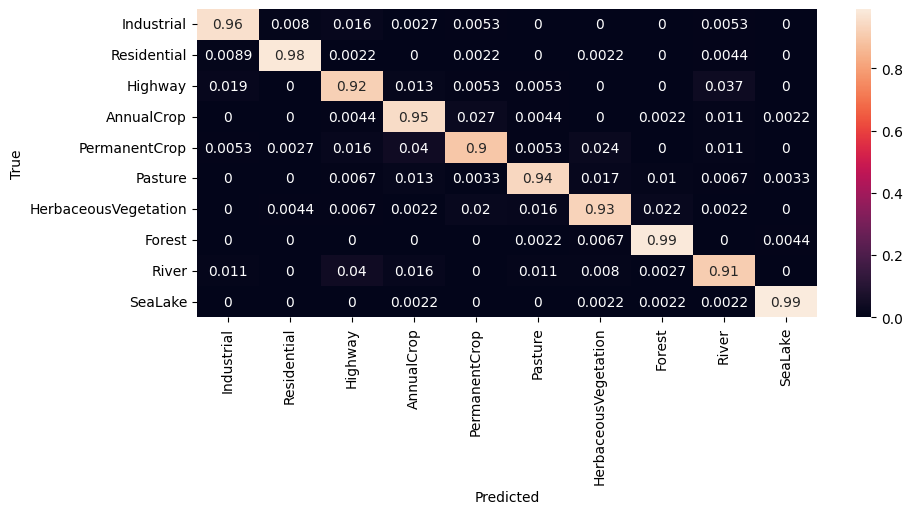

In [ ]:
# ## takes about 15 mins with full feature vectors with GPU runtime

# # Define hyperparameter grid
# param_grid = {
#     "objective": ["multi:softmax"],
#     "eval_metric": ["mlogloss"],
#     "n_estimators": [50, 100, 200],
#     "max_depth": [3, 5, 7],
#     "learning_rate": [0.01, 0.1, 0.3],
#     "early_stopping_rounds": [10],
# }

# # Create grid search object
# grid_search2_2 = GridSearchCV(xgb.XGBClassifier(), param_grid, cv=[(slice(None), slice(None))], scoring="neg_log_loss")

# # Train XGBoost model with grid search
# grid_search2_2.fit(input_train_full, train_labels, eval_set=[(input_val_full, val_labels)], verbose=False)

# # Get best model and its hyperparameters
# best_model2_2 = grid_search2_2.best_estimator_
# best_params2_2 = grid_search2_2.best_params_

# print(f"Best hyperparameters: {best_params2_2}")

# # Make predictions on test set
# dtest2_2 = xgb.DMatrix(input_test_full)
# test_pred2_2 = best_model2_2.predict(input_test_full)

# # Evaluate model on test set
# accuracy2_2 = (test_pred2_2 == test_labels).mean()
# print(f"Test Accuracy: {accuracy2_2:.4f}")

# # Save the best model
# best_model2_2.save_model(os.path.join(drive_path, 'models/best_2_2_XGBoost.xgb'))

# target_names=test_df[["class_name", "class_id"]].drop_duplicates()["class_name"].values
# print(classification_report(test_labels, test_pred2_2, target_names=target_names))
# cm2_2 = tf.math.confusion_matrix(test_labels, test_pred2_2)
# cm2_2 = cm2_2/cm2_2.numpy().sum(axis=1)[:, tf.newaxis]

# plt.figure(figsize=(10,4))
# sns.heatmap(
#     cm2_2, annot=True,
#     xticklabels=target_names,
#     yticklabels=target_names)
# plt.xlabel("Predicted")
# plt.ylabel("True")
